In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
282,2021-10-16,0.000
283,2021-10-17,0.754
284,2021-10-18,0.333
285,2021-10-19,0.458


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-11-06    0.000
2021-11-07    0.754
2021-11-08    0.333
2021-11-09    0.458
2021-11-10    1.931
Name: Vacunas, Length: 287, dtype: float64

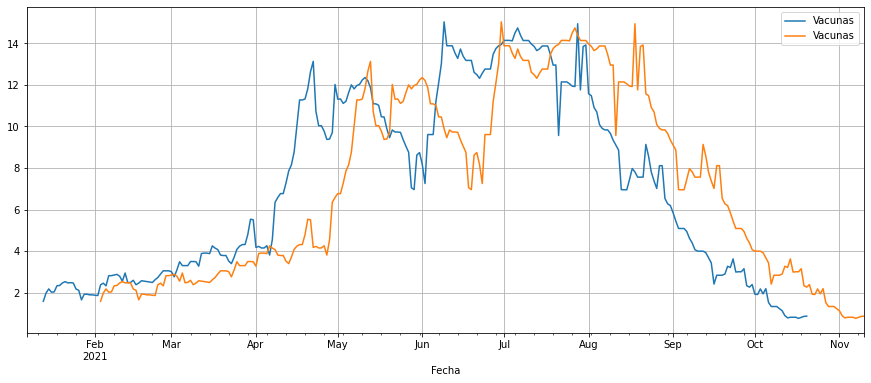

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

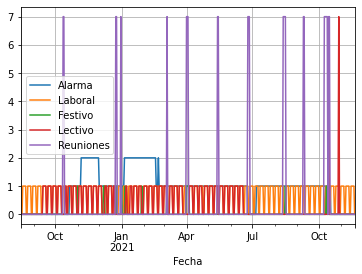

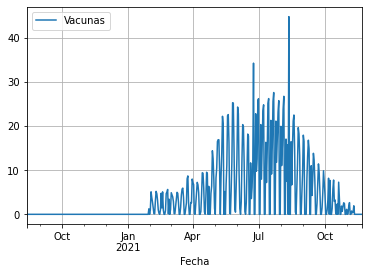

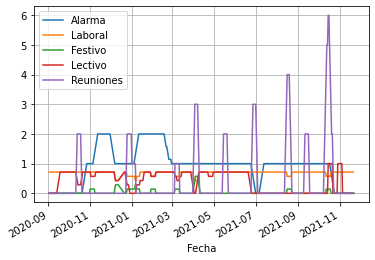

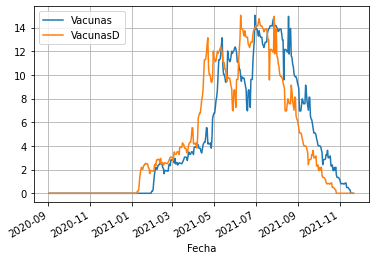

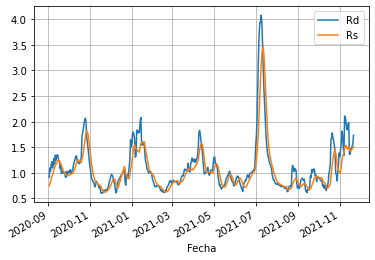

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
#puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/10/31':'2020/10/30','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/11/1','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']


puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1
puntos.loc['2021-10-12','Festivo']=1
#puntos.loc['2021-11-1','Festivo']=1



puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0
puntos.loc['2021/10/15':'2021/10/16','Lectivo']=7
puntos.loc['2021-10-29':'2021-10-30','Lectivo']=7
#puntos.loc['2021-11-1','Lectivo']=7

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
#puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7
puntos.loc['2021/10/9':'2021/10/13','Reuniones']=7
puntos.loc['2021/10/15':'2021/10/16','Reuniones']=7
#puntos.loc['2021-11-1','Reuniones']=7


puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail(20).T

Fecha,2021-11-02,2021-11-03,2021-11-04,2021-11-05,2021-11-06,2021-11-07,2021-11-08,2021-11-09,2021-11-10,2021-11-11,2021-11-12,2021-11-13,2021-11-14,2021-11-15,2021-11-16,2021-11-17,2021-11-18,2021-11-19,2021-11-20,2021-11-21
Día de la semana,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000
Casos,105.000000,144.000000,1.230000e+02,152.000000,80.000000,49.000000,131.000000,155.000000,171.000000,1.790000e+02,187.000000,132.000000,57.000000,180.000000,230.000000,331.000000,2.740000e+02,278.000000,261.000000,134.000000
test coresp,2285.000000,2600.000000,2.094000e+03,3067.000000,2237.000000,937.000000,2461.000000,2626.000000,2710.000000,2.390000e+03,2348.000000,1718.000000,1057.000000,2482.000000,2919.000000,3501.000000,3.095000e+03,2728.000000,2028.000000,1266.000000
Nº de pacientes a los que se ha realizado pruebas,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
Tasa de positividad (%),4.600000,5.540000,5.870000e+00,4.960000,3.580000,5.230000,5.320000,5.900000,6.310000,7.490000e+00,7.960000,7.680000,5.390000,7.250000,7.880000,9.450000,8.850000e+00,10.190000,12.870000,10.580000
Asintomáticos,59.850000,48.960000,6.888000e+01,80.560000,68.000000,29.400000,70.740000,91.450000,107.730000,9.487000e+01,56.100000,110.880000,30.780000,88.200000,115.000000,215.150000,1.644000e+02,147.340000,190.530000,41.540000
Zaragoza,60.000000,119.000000,1.010000e+02,116.000000,68.000000,34.000000,72.000000,108.000000,104.000000,1.070000e+02,142.000000,97.000000,25.000000,92.000000,149.000000,209.000000,1.560000e+02,184.000000,194.000000,79.000000
1 a 14 años,19.000000,38.000000,2.300000e+01,36.000000,19.000000,7.000000,15.000000,23.000000,33.000000,1.600000e+01,24.000000,20.000000,4.000000,29.000000,33.000000,78.000000,3.900000e+01,48.000000,52.000000,18.000000
15 a 24 años,2.000000,6.000000,1.000000e+01,13.000000,4.000000,4.000000,11.000000,14.000000,15.000000,1.400000e+01,11.000000,6.000000,0.000000,7.000000,17.000000,13.000000,1.900000e+01,18.000000,9.000000,3.000000
25 a 34 años,15.000000,15.000000,1.600000e+01,10.000000,7.000000,6.000000,13.000000,19.000000,18.000000,1.600000e+01,19.000000,14.000000,6.000000,17.000000,20.000000,28.000000,2.000000e+01,33.000000,30.000000,6.000000


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-11-22,2021-11-23,2021-11-24
Día de la semana,1.000000,2.000000,3.000000
Casos,324.000000,NaN,NaN
test coresp,2998.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,0.000000,NaN,NaN
Tasa de positividad (%),10.810000,NaN,NaN
Asintomáticos,204.120000,NaN,NaN
Zaragoza,190.000000,NaN,NaN
1 a 14 años,60.000000,NaN,NaN
15 a 24 años,18.000000,NaN,NaN
25 a 34 años,30.000000,NaN,NaN


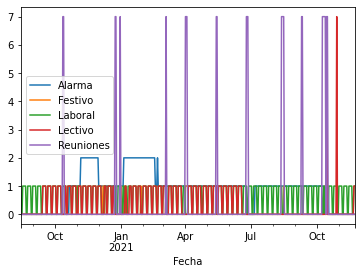

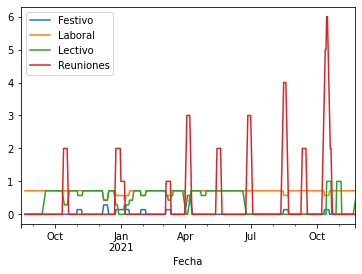

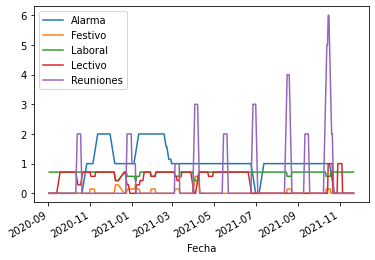

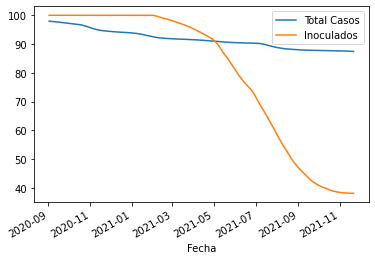

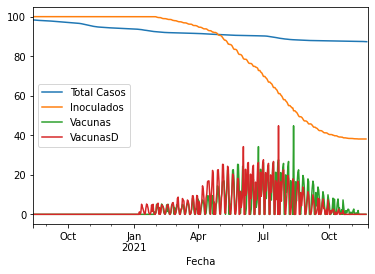

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

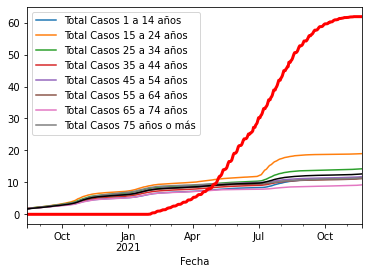

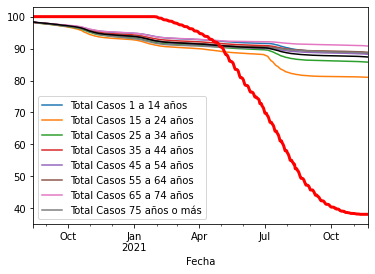

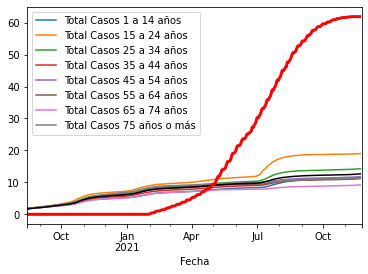

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-11-20,87.362521,38.109475
2021-11-21,87.352364,38.109475
2021-11-22,87.327805,NaN


,Total Casos,Inoculados
Fecha,,
2021-11-22,87.327805,NaN
2021-11-23,NaN,NaN
2021-11-24,NaN,NaN


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-22,1,324.0,2998.0,0.0,10.81,204.12,190.0,60.0,18.0,30.0,...,NaN,87.327805,88.435579,80.989917,85.73358,88.580492,88.167585,88.813624,90.773739,88.562533
2021-11-23,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-24,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-20,6,261.0,2028.0,0.0,12.87,190.53,194.0,52.0,9.0,30.0,...,90.798151,88.612394,18126.0,21421.0,17772.0,19431.0,20807.0,16713.0,10141.0,14572.0
2021-11-21,7,134.0,1266.0,0.0,10.58,41.54,79.0,18.0,3.0,6.0,...,90.787794,88.587796,18144.0,21424.0,17778.0,19445.0,20833.0,16725.0,10155.0,14609.0
2021-11-22,1,324.0,2998.0,0.0,10.81,204.12,190.0,60.0,18.0,30.0,...,90.773739,88.562533,18204.0,21442.0,17808.0,19495.0,20890.0,16774.0,10174.0,14647.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    #'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.867607,0.949972,0.912700,0.861343,0.977108,0.793255,0.918552,0.745894,0.818020,0.861831,...,1,1,1.000102,1.000177,1.000107,1.000085,1.000082,1.000076,1.000048,1.000055
2,1.191412,1.214187,0.973881,1.162480,0.971776,1.195348,0.999690,1.246018,1.157889,1.180558,...,1,1,1.000058,1.000111,1.000055,1.000037,1.000041,1.000032,1.000032,1.000035
3,1.195135,1.235766,0.968924,1.181292,0.986689,1.211005,1.013765,1.244322,1.258004,1.193587,...,1,1,1.000005,1.000012,1.000004,0.999992,0.999995,0.999991,1.000007,1.000017
4,1.200535,1.137151,1.056426,1.216384,1.010907,1.207226,1.009980,1.209786,1.274604,1.200698,...,1,1,0.999958,0.999907,0.999946,0.999960,0.999957,0.999962,0.999974,0.999969
5,1.141889,1.095258,1.052361,1.060476,0.925670,1.153071,1.017080,1.183140,1.177218,1.179957,...,1,1,0.999908,0.999817,0.999893,0.999921,0.999921,0.999931,0.999947,0.999942
6,0.836162,0.791711,1.083864,0.937791,1.112244,0.879073,1.050180,0.896273,0.798244,0.822211,...,1,1,0.999929,0.999884,0.999933,0.999957,0.999953,0.999961,0.999964,0.999957
7,0.538290,0.563006,0.941296,0.550464,1.013766,0.533035,0.990117,0.443863,0.483134,0.519572,...,1,1,1.000041,1.000078,1.000057,1.000048,1.000050,1.000044,1.000027,1.000020


Casos                        0.995861
test coresp                  0.998150
Tasa de positividad (%)      0.998493
Asintomáticos                0.995747
Asintomáticos (%)            0.999737
Zaragoza                     0.996002
Zaragoza (%)                 0.999909
1 a 14 años                  0.995614
15 a 24 años                 0.995302
25 a 34 años                 0.994059
35 a 44 años                 0.995401
45 a 54 años                 0.997111
55 a 64 años                 0.994458
65 a 74 años                 0.995776
75 años o más                0.991546
Camas Ocup                   0.997982
Camas libres                 0.999841
Camas (%)                    0.997247
UCI ocupadas                 0.998752
UCI libres con resp          0.999486
UCI (%)                      0.997887
Rs                           1.000000
Rd                           1.000000
Inoculados                   1.000000
Total Casos                  1.000000
Total Casos 1 a 14 años      1.000000
Total Casos 

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-11-17    1.505226
2021-11-18    1.516903
2021-11-19    1.556723
2021-11-20    1.604582
2021-11-21    1.667984
Name: Casos, Length: 465, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-11-22   NaN
2021-11-23   NaN
2021-11-24   NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,0.978313,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,0.823529,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,0.921569,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,33.428571,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,31.714286,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,34.000000,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,33.857143,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,32.000000,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,185.142857,2345.000000,7.585714,101.568571,55.000000,117.285714,61.727511,29.142857,9.714286,17.142857,...,38.109475,87.472634,88.617032,81.068686,85.857978,88.743808,88.329171,88.956625,90.907951,88.690747
2021-11-18,198.714286,2445.714286,7.780000,111.501429,56.000000,124.285714,61.321478,32.428571,10.428571,17.714286,...,38.109475,87.457572,88.599460,81.060267,85.845477,88.725289,88.312403,88.941194,90.892099,88.679540
2021-11-19,211.714286,2500.000000,8.098571,124.535714,59.285714,130.285714,59.928795,35.857143,11.428571,19.714286,...,38.109475,87.441524,88.580029,81.051041,85.831566,88.706130,88.294387,88.925035,90.875931,88.667668


<AxesSubplot:xlabel='Fecha'>

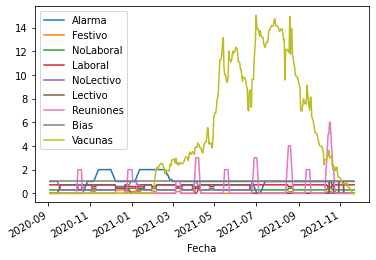

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 55.7 ms, sys: 13.9 ms, total: 69.7 ms
Wall time: 12.5 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000052,0.000010,-0.002795,-0.000059,0.001291,-0.000461,-0.000459,-0.000981,0.000656,0.001387,...,0.948066,-0.007852,-0.004428,-3.709348,-3.601980,-3.647846,-3.663482,0.004377,-7.311328,-0.000736
2020-09-04,0.000198,0.000035,0.000819,-0.000113,0.000791,-0.000217,-0.000344,-0.001448,0.000043,0.000865,...,0.806114,-0.006707,-0.039756,-4.141561,-4.126342,-4.126324,-4.141580,0.005634,-8.267903,-0.001911
2020-09-05,0.000670,0.000015,-0.000600,-0.000141,0.001748,-0.000640,0.000162,-0.000739,0.000175,0.000407,...,0.598304,-0.005254,0.009795,-2.249621,-2.151346,-2.190535,-2.210432,0.002366,-4.400967,-0.001183
2020-09-06,-0.000218,-0.000004,-0.001638,0.000071,0.001168,0.000211,0.000021,-0.000408,0.000516,0.001231,...,0.518977,-0.008489,-0.004106,-1.980000,-1.921999,-1.941553,-1.960447,0.001579,-3.901999,-0.001970
2020-09-07,0.000080,0.000002,0.002280,0.000186,-0.000335,0.000392,0.000830,-0.000861,-0.000332,0.000236,...,0.248976,-0.007633,-0.004400,-1.485016,-1.443819,-1.456691,-1.472145,0.001436,-2.928836,-0.003683
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-17,-0.000096,0.000028,0.008596,0.000624,-0.002360,0.000216,-0.001012,-0.000676,-0.000178,-0.001259,...,-0.159586,-0.011842,-0.079993,0.902745,0.813426,0.857434,0.858738,0.002644,1.716171,-0.000517
2021-11-18,-0.000297,0.000023,0.010113,0.000729,-0.002353,0.000041,-0.000630,0.000333,0.000069,-0.001615,...,-0.216143,-0.002866,-0.068944,1.707962,1.672144,1.689680,1.690425,0.002396,3.380105,-0.002498
2021-11-19,-0.000496,0.000035,0.012687,0.000830,-0.001659,-0.000387,-0.000201,0.000620,0.000647,-0.001616,...,-0.085871,0.002358,-0.084784,1.598113,1.593142,1.594382,1.596873,0.003133,3.191255,-0.003254



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


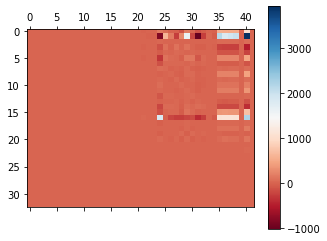

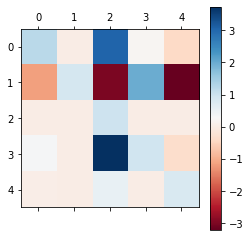

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(42, 437) = (42, 42)·(42, 42)·(42, 437)
CPU times: user 27.2 ms, sys: 10.5 ms, total: 37.7 ms
Wall time: 6.57 ms


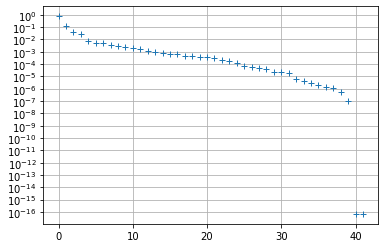

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{32}$,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$
Casos,-0.114590,0.252220,-0.120718,0.674980,-0.117400,0.034651,0.044475,-0.069739,-0.410593,0.094746,...,-0.000672,-0.001455,-0.001647,-0.000061,-0.000067,-0.000026,-0.000028,-8.727447e-06,1.689273e-18,4.673765e-18
test coresp,-0.886259,0.334760,-0.111113,-0.296780,0.008857,-0.017654,-0.003644,0.018435,-0.009283,-0.029725,...,0.000073,0.000071,-0.000021,-0.000014,-0.000003,-0.000019,0.000009,3.054429e-06,-3.406401e-19,-4.484324e-19
Tasa de positividad (%),-0.003426,0.000981,-0.000015,0.022962,0.008187,0.004069,-0.013829,0.002862,-0.027920,0.013300,...,0.007257,0.002424,-0.004874,0.004736,0.001122,-0.004980,0.001560,5.144975e-04,-5.740703e-17,-3.462042e-19
Asintomáticos,-0.058066,0.133916,-0.085607,0.334547,-0.136554,-0.210886,0.357372,-0.144759,0.737123,0.035102,...,-0.000012,0.000214,0.000341,0.000139,0.000177,0.000068,-0.000005,-1.629075e-07,-2.364117e-18,1.984019e-18
Asintomáticos (%),-0.015064,-0.027036,-0.006658,-0.020112,-0.113210,-0.054369,0.094604,-0.326443,0.144953,0.038504,...,0.001977,-0.001188,0.000180,0.000317,-0.000800,-0.000749,0.000027,-3.644329e-05,2.055511e-18,2.069986e-17
Zaragoza,-0.080193,0.161863,-0.079078,0.429853,0.049743,0.219109,-0.302233,0.251422,0.142013,-0.043731,...,-0.001163,0.000121,0.000581,0.000043,-0.000202,-0.000144,0.000104,-1.736808e-05,2.097623e-18,-6.130662e-18
Zaragoza (%),-0.021378,-0.042576,0.002911,-0.031513,-0.026184,0.186734,-0.143607,-0.064951,0.153918,0.235467,...,-0.001406,-0.000884,0.000388,0.000396,-0.000253,0.000148,0.000253,5.209890e-05,6.843309e-18,-4.957229e-18
1 a 14 años,-0.013948,0.023843,-0.023807,0.044796,-0.046835,-0.318658,0.034091,0.319430,-0.042547,0.517148,...,-0.000107,-0.002308,0.001076,0.000912,0.000693,0.000481,-0.000414,-2.033250e-05,1.846666e-18,2.745731e-18
15 a 24 años,-0.017396,0.037967,-0.168452,0.168164,0.783218,0.025645,-0.009600,-0.355081,-0.078201,-0.085226,...,0.000768,0.000761,0.001910,0.000040,-0.000075,0.000059,-0.000256,5.395355e-06,4.508820e-18,5.452480e-18
25 a 34 años,-0.014113,0.032070,-0.057113,0.098293,0.129999,-0.045271,0.027662,0.026310,0.097860,0.110391,...,-0.000275,0.000580,0.001762,0.001169,-0.000621,0.000381,-0.000178,3.774897e-05,1.635113e-18,3.063676e-18


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 1.98 ms, sys: 517 µs, total: 2.5 ms
Wall time: 2.04 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 137 ms, sys: 6.34 ms, total: 143 ms
Wall time: 23.8 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.032924,7.490153e-03,3.901946,0.257993,-0.527321,-0.296413,0.294249,-0.882154,0.405402,-0.426145,...,-6.873781,-2.238439,-22.085300,10.165540,-10.745566,-0.419229,-0.160798,-0.188752,-0.580026,-0.229736
test coresp,-3.652690,8.695487e-01,2.598907,2.779028,-4.326973,0.751147,-0.764280,2.168152,4.117902,-0.508973,...,-71.558242,10.858413,-109.582973,160.201023,-165.075545,-40.817177,35.942655,-13.341139,-4.874521,-0.319591
Tasa de positividad (%),0.011195,5.855752e-04,1.038269,-0.005449,-0.005733,-0.010966,0.010695,-0.022647,-0.001286,0.005454,...,-0.169042,-0.474353,-0.232040,-0.319306,0.331868,0.111862,-0.099300,0.079450,0.012562,-0.020951
Asintomáticos,0.038480,3.916471e-03,3.158225,1.006974,-0.302638,-0.108364,0.388792,-0.344762,0.325154,-0.334327,...,-5.930150,-3.075749,-6.923595,4.273187,-4.321697,-0.094756,0.046245,-0.800161,-0.048511,-1.111174
Asintomáticos (%),0.025336,6.348204e-04,0.363164,-0.000311,0.838867,0.016035,0.092874,-0.045499,-0.018956,-0.072157,...,-1.113976,0.490846,0.502603,0.827974,-0.794279,0.079308,-0.045613,0.008342,0.033695,-0.187959
Zaragoza,0.109698,5.011053e-03,1.952985,0.163352,-0.111161,0.608248,0.273151,-0.514065,0.349552,-0.307534,...,8.795215,-0.556620,2.734855,-5.737813,5.592060,0.307076,-0.452828,-0.260386,-0.145752,-0.475980
Zaragoza (%),-0.030027,-7.357072e-04,-0.320189,-0.002823,0.023871,0.007927,0.874734,0.033321,0.029862,0.033487,...,4.600843,0.711888,7.156278,-5.190012,5.333601,0.030554,0.113036,-0.033886,0.143589,-0.193358
1 a 14 años,-0.042111,6.596562e-04,0.605989,0.076233,-0.127238,-0.039273,0.079223,0.844426,0.074786,0.044315,...,-0.416408,-0.380485,-1.885728,-0.159310,0.140078,-0.342302,0.323070,0.026261,-0.019232,-0.156228
15 a 24 años,0.061211,3.358890e-03,0.904167,0.024090,-0.229785,-0.050383,0.040393,-0.237608,0.990107,-0.201866,...,-7.209800,-2.251852,-7.539584,4.606756,-4.633815,-0.405682,0.378623,0.146915,-0.027059,0.514206
25 a 34 años,0.002380,1.347742e-03,0.651066,0.023923,-0.011301,-0.029322,0.036147,-0.119423,0.089741,0.827761,...,-0.576219,-0.359777,-1.300815,1.582384,-1.640908,-0.343652,0.285128,-0.171907,-0.058524,-0.012621


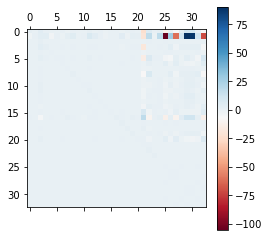

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.032924,7.490153e-03,3.901946,0.257993,-0.527321,-0.296413,0.294249,-0.882154,0.405402,-0.426145,...,0.451922,1.952546,-12.154369,0.079582,-7.600402,1.845343,11.417416,10.301931,0.903847,-6.873781
test coresp,-3.652690,8.695487e-01,2.598907,2.779028,-4.326973,0.751147,-0.764280,2.168152,4.117902,-0.508973,...,-1.090064,16.992992,-105.243925,26.422561,-61.623181,11.364656,90.283949,87.419009,11.466770,-71.558242
Tasa de positividad (%),0.011195,5.855752e-04,1.038269,-0.005449,-0.005733,-0.010966,0.010695,-0.022647,-0.001286,0.005454,...,-0.016469,-0.044054,0.300271,0.087047,0.012877,0.036736,-0.193155,-0.139750,0.098672,-0.169042
Asintomáticos,0.038480,3.916471e-03,3.158225,1.006974,-0.302638,-0.108364,0.388792,-0.344762,0.325154,-0.334327,...,-0.422232,0.165920,-0.513532,2.460407,-2.750558,1.126423,1.470684,2.118022,2.131142,-5.930150
Asintomáticos (%),0.025336,6.348204e-04,0.363164,-0.000311,0.838867,0.016035,0.092874,-0.045499,-0.018956,-0.072157,...,-0.217283,-0.097557,0.845655,0.838107,-0.088304,0.144315,-0.555025,-0.249999,0.546073,-1.113976
Zaragoza,0.109698,5.011053e-03,1.952985,0.163352,-0.111161,0.608248,0.273151,-0.514065,0.349552,-0.307534,...,0.895644,0.413074,-3.965867,-5.573447,1.696711,-1.181810,2.526571,0.312942,-4.023408,8.795215
Zaragoza (%),-0.030027,-7.357072e-04,-0.320189,-0.002823,0.023871,0.007927,0.874734,0.033321,0.029862,0.033487,...,0.140617,-0.485428,2.780783,-1.960621,2.728626,-0.770722,-2.688318,-3.026065,-1.264508,4.600843
1 a 14 años,-0.042111,6.596562e-04,0.605989,0.076233,-0.127238,-0.039273,0.079223,0.844426,0.074786,0.044315,...,-0.049707,0.084610,-0.315660,0.006809,-0.365552,0.169535,0.406971,0.410776,0.130702,-0.416408
15 a 24 años,0.061211,3.358890e-03,0.904167,0.024090,-0.229785,-0.050383,0.040393,-0.237608,0.990107,-0.201866,...,-0.325578,0.077760,-0.066074,3.070025,-2.965603,1.280099,1.285640,2.073851,2.808984,-7.209800
25 a 34 años,0.002380,1.347742e-03,0.651066,0.023923,-0.011301,-0.029322,0.036147,-0.119423,0.089741,0.827761,...,0.048961,0.191051,-1.286264,0.071842,-0.686774,0.100047,1.081788,0.996065,0.011111,-0.576219


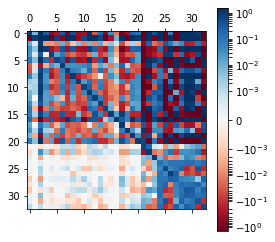

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(33, 437) = (33, 33)·(33, 33)·(33, 437)
CPU times: user 102 ms, sys: 33.4 ms, total: 136 ms
Wall time: 30.5 ms


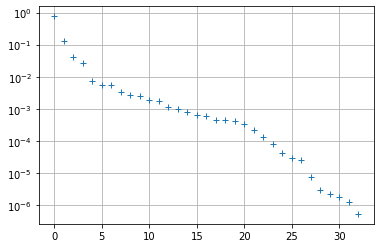

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.114597,0.252210,-0.118821,0.675048,-0.118997,0.035009,-0.046464,0.074043,-0.404706,0.124320,...,-0.054528,-0.009301,-0.000363,-0.007422,-0.005459,-0.002233,-0.001659,-0.000079,-0.000296,-0.000009
test coresp,-0.886375,0.334483,-0.112015,-0.296383,0.009615,-0.017777,0.004056,-0.019094,-0.010946,-0.028865,...,-0.004010,0.000188,0.000995,-0.000080,0.000050,0.000068,-0.000023,-0.000011,0.000011,-0.000023
Tasa de positividad (%),-0.003426,0.000981,0.000014,0.022872,0.007684,0.004128,0.013378,-0.002435,-0.028324,0.019501,...,-0.914789,0.004718,0.239716,0.014585,-0.010766,-0.008546,-0.005834,0.005722,0.002160,-0.004268
Asintomáticos,-0.058065,0.133961,-0.085230,0.334181,-0.141581,-0.215122,-0.351278,0.141086,0.742059,-0.015810,...,-0.014213,0.003731,0.004881,0.000052,0.000742,-0.000260,0.000394,0.000122,0.000066,0.000144
Asintomáticos (%),-0.015062,-0.027032,-0.006884,-0.020288,-0.113761,-0.055431,-0.091757,0.325455,0.147036,0.025575,...,-0.009426,-0.029920,0.001457,-0.016012,-0.001004,0.003543,-0.000415,0.000215,-0.000244,-0.000942
Zaragoza,-0.080180,0.161887,-0.077609,0.430546,0.053109,0.223169,0.300275,-0.252481,0.136905,-0.059590,...,0.063380,0.025252,0.000810,0.013784,0.003625,-0.000843,0.000892,0.000083,-0.000144,-0.000234
Zaragoza (%),-0.021371,-0.042584,0.002976,-0.031310,-0.023915,0.189573,0.142067,0.068565,0.167866,0.216003,...,-0.162796,-0.050214,0.006372,-0.022179,-0.005665,-0.003300,0.000134,0.000304,-0.000195,0.000060
1 a 14 años,-0.013960,0.023818,-0.023716,0.044698,-0.049527,-0.317520,-0.030617,-0.313410,-0.021435,0.558314,...,0.076855,-0.013935,-0.022123,-0.003607,-0.005767,-0.003738,0.000436,0.000990,0.000684,0.000767
15 a 24 años,-0.017388,0.037946,-0.167480,0.169941,0.783835,0.019753,0.003224,0.353295,-0.081456,-0.079948,...,0.060696,-0.014758,0.004398,-0.008177,0.007617,0.001590,0.001591,0.000031,0.000416,-0.000025
25 a 34 años,-0.014108,0.032077,-0.056754,0.098792,0.130200,-0.046447,-0.027050,-0.026973,0.101076,0.119412,...,0.042381,-0.013844,-0.037062,0.009071,0.002421,0.002646,0.001924,0.000876,-0.000820,0.000141


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

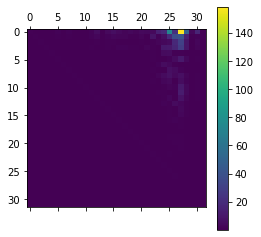

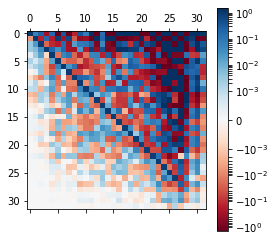

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

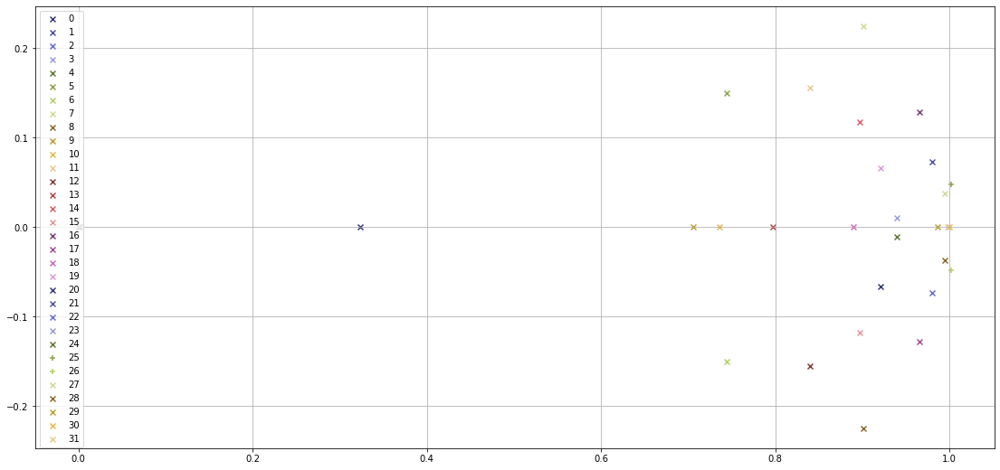

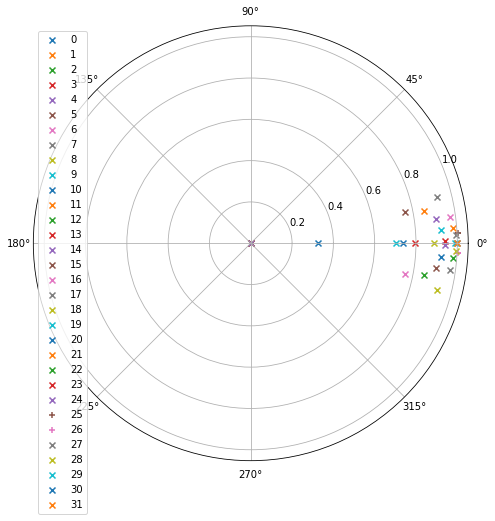

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-17,4.0,198.714286,2445.714286,0.0,7.780000,111.501429,124.285714,32.428571,10.428571,17.714286,...,38.109475,87.457572,88.599460,81.060267,85.845477,88.725289,88.312403,88.941194,90.892099,88.679540
2021-11-18,4.0,211.714286,2500.000000,0.0,8.098571,124.535714,130.285714,35.857143,11.428571,19.714286,...,38.109475,87.441524,88.580029,81.051041,85.831566,88.706130,88.294387,88.925035,90.875931,88.667668
2021-11-19,4.0,230.142857,2544.285714,0.0,8.840000,135.914286,144.142857,40.428571,11.857143,22.000000,...,38.109475,87.424080,88.558122,81.041469,85.816041,88.685404,88.275055,88.907665,90.858599,88.654847
2021-11-20,4.0,241.142857,2574.142857,0.0,9.581429,137.451429,151.857143,42.428571,12.285714,22.000000,...,38.109475,87.405802,88.535130,81.031550,85.800517,88.664465,88.254614,88.890214,90.840528,88.639271
2021-11-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-17,168.230676,2345.708805,6.864863,89.915163,56.019111,99.205052,58.768285,24.176667,11.374096,17.898519,...,38.137940,87.491843,88.543554,81.106181,85.823360,88.752671,88.386492,89.021493,90.916308,88.657023
2021-11-18,181.224180,2393.724559,7.181788,96.004312,55.238673,106.296642,58.168354,25.732111,12.645604,18.216013,...,38.126225,87.478732,88.528128,81.098921,85.807627,88.740510,88.371382,89.006189,90.904745,88.645435
2021-11-19,201.934790,2514.772283,7.549544,110.024830,55.476814,120.015507,58.602862,31.668098,12.622820,19.311566,...,38.122169,87.463586,88.512984,81.091680,85.794731,88.726132,88.359189,88.985879,90.885280,88.635624
2021-11-20,215.332646,2612.156789,7.729439,118.855256,56.179061,127.755107,58.340540,35.051554,13.120934,20.055782,...,38.120794,87.448457,88.492218,81.082904,85.784660,88.713497,88.346979,88.968273,90.864727,88.619283
2021-11-21,227.343872,2669.130402,7.984516,130.435874,58.848787,134.343926,57.249223,38.352716,13.317115,21.877165,...,38.118693,87.433670,88.476326,81.072126,85.769401,88.697128,88.329923,88.948985,90.840945,88.607266


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,...,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000
mean,5.409597,3.518710,3.895376,12.386832,1.318963,1.000146,-3.137216,5.286779,11.022780,7.163136,...,0.207526,0.004713,-0.104604,0.033416,-0.030170,-0.015572,0.077443,0.065835,-0.008345,-0.089916
std,6.865445,3.934850,5.041128,13.622444,3.645065,5.720291,2.355044,9.029124,23.096984,10.035178,...,0.219827,0.007723,0.024662,0.014998,0.017815,0.012186,0.037860,0.025640,0.010301,0.048489
min,-11.668572,-7.797079,-11.844259,-12.130575,-8.006940,-17.015935,-10.798285,-19.359651,-84.873703,-14.287848,...,-0.012313,-0.013329,-0.163509,0.005893,-0.073604,-0.047496,0.020531,0.013984,-0.037840,-0.189677
25%,1.126408,1.148234,0.619125,3.383309,-1.125748,-2.140383,-4.620887,-0.539780,-0.549177,0.829804,...,0.019600,0.001280,-0.123972,0.021511,-0.042527,-0.022149,0.047236,0.046671,-0.014536,-0.137807
50%,3.815071,2.978514,4.068270,9.280106,1.011399,0.352711,-3.172928,3.445415,6.652741,4.565793,...,0.107726,0.004944,-0.100324,0.032081,-0.031748,-0.015999,0.064753,0.059909,-0.008126,-0.075434
75%,8.213694,5.752894,7.180790,17.413313,3.409786,4.055023,-1.573471,9.906771,17.415957,9.976546,...,0.361569,0.007727,-0.084667,0.043325,-0.018274,-0.009095,0.116055,0.090342,-0.001688,-0.051041
max,43.229983,27.370395,18.899578,64.975138,18.194539,19.078853,8.856174,51.533146,153.209174,49.738046,...,0.826829,0.128291,0.003331,0.141478,0.120341,0.094995,0.207532,0.157250,0.073151,0.139847


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                         123.000000
test coresp                  2304.571429
Tasa de positividad (%)         5.310000
Asintomáticos                  73.822857
Asintomáticos (%)              61.428571
Zaragoza                       86.142857
Zaragoza (%)                   71.182190
1 a 14 años                    22.285714
15 a 24 años                   10.142857
25 a 34 años                   12.714286
35 a 44 años                   20.142857
45 a 54 años                   18.142857
55 a 64 años                   15.000000
65 a 74 años                   12.142857
75 años o más                  12.000000
Camas Ocup                     87.571429
Camas libres                 1185.142857
Camas (%)                       7.443656
UCI ocupadas                   14.714286
UCI libres con resp            95.571429
UCI (%)                        15.379030
Rs                              1.537426
Rd                              1.995934
Inoculados                     38.186687
Total Casos     

Casos                         131.000000
test coresp                  2346.857143
Tasa de positividad (%)         5.541429
Asintomáticos                  77.535714
Asintomáticos (%)              61.000000
Zaragoza                       87.000000
Zaragoza (%)                   67.991149
1 a 14 años                    21.285714
15 a 24 años                   10.714286
25 a 34 años                   12.714286
35 a 44 años                   20.857143
45 a 54 años                   19.285714
55 a 64 años                   17.285714
65 a 74 años                   14.857143
75 años o más                  13.571429
Camas Ocup                     91.571429
Camas libres                 1180.571429
Camas (%)                       7.821892
UCI ocupadas                   15.285714
UCI libres con resp            96.000000
UCI (%)                        15.902328
Rs                              1.495883
Rd                              1.859294
Inoculados                     38.171324
Total Casos     

Casos                         132.208264
test coresp                  2425.364461
Tasa de positividad (%)         5.294974
Asintomáticos                  76.337758
Asintomáticos (%)              61.197543
Zaragoza                       86.606306
Zaragoza (%)                   67.922057
1 a 14 años                    22.434391
15 a 24 años                   14.635409
25 a 34 años                   13.711320
35 a 44 años                   22.084598
45 a 54 años                   18.787100
55 a 64 años                   16.646997
65 a 74 años                   13.481208
75 años o más                  11.353479
Camas Ocup                     87.206267
Camas libres                 1179.014906
Camas (%)                       7.325815
UCI ocupadas                   14.864374
UCI libres con resp            97.285277
UCI (%)                        10.708270
Rs                              1.611608
Rd                              2.052532
Inoculados                     38.203306
Total Casos     

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-11-14,0.0,0.0,0.0,0.0,0.0,57.0,0.0
2021-11-15,0.0,0.0,0.0,0.0,0.0,180.0,0.0
2021-11-16,0.0,0.0,0.0,0.0,0.0,230.0,0.0
2021-11-17,0.0,0.0,0.0,0.0,0.0,331.0,0.0
2021-11-18,0.0,0.0,0.0,0.0,0.0,274.0,0.0
2021-11-19,0.0,0.0,0.0,0.0,0.0,278.0,0.0
2021-11-20,0.0,0.0,0.0,0.0,0.0,261.0,0.0
2021-11-21,0.0,0.0,0.0,0.0,0.0,134.0,0.0
2021-11-22,0.0,0.0,0.0,NaN,NaN,324.0,1.0
2021-11-23,0.0,0.0,0.0,NaN,NaN,NaN,1.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-11-20,0.0,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,0.000000
2021-11-21,0.0,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,0.000000
2021-11-22,0.0,0.0,0.285714,0.714286,0.857143,0.142857,0.0,1.0,2.285714
2021-11-23,0.0,0.0,0.285714,0.714286,0.714286,0.285714,0.0,1.0,4.571429
2021-11-24,0.0,0.0,0.285714,0.714286,0.571429,0.428571,0.0,1.0,6.857143
2021-11-25,0.0,0.0,0.285714,0.714286,0.428571,0.571429,0.0,1.0,9.142857
2021-11-26,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,11.428571
2021-11-27,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,13.714286
2021-11-28,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,16.000000
2021-11-29,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,16.000000


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-11-20,0.0,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,0.0
2021-11-21,0.0,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,0.0
2021-11-22,0.0,0.0,0.285714,0.714286,0.857143,0.142857,0.0,1.0,2.0
2021-11-23,0.0,0.0,0.285714,0.714286,0.714286,0.285714,0.0,1.0,4.0
2021-11-24,0.0,0.0,0.285714,0.714286,0.571429,0.428571,0.0,1.0,6.0
2021-11-25,0.0,0.0,0.285714,0.714286,0.428571,0.571429,0.0,1.0,8.0
2021-11-26,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,10.0
2021-11-27,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,12.0
2021-11-28,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,14.0
2021-11-29,0.0,0.0,0.285714,0.714286,0.285714,0.714286,0.0,1.0,14.0


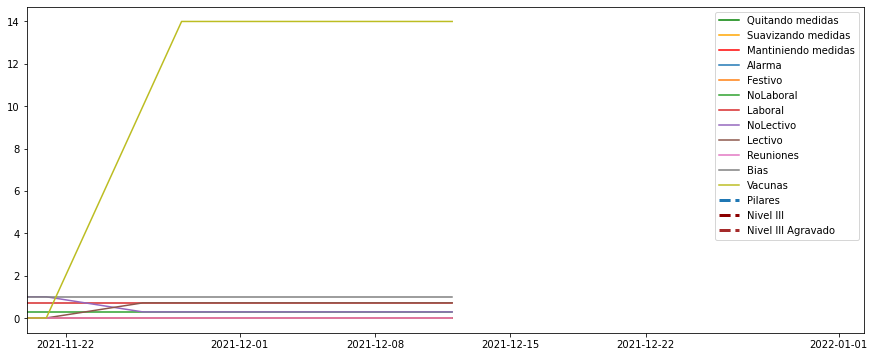

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
#U1.loc['2021-10-12','Festivo']=1
U1.loc['2021-11-1','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
#U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
#U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
#U1.loc['2021-10-9':'2021-10-13','Reuniones']=7
#U1.loc['2021-10-15':'2021-10-16','Reuniones']=7
#U1.loc['2021-10-29':'2021-10-30','Reuniones']=7
U1.loc['2021-11-1','Reuniones']=7

U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
#U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
#U1.loc['2021-10-9':'2021-10-13','Lectivo']=0
U1.loc['2021-11-1','Lectivo']=0
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 1 µs, sys: 0 ns, total: 1 µs
Wall time: 2.86 µs


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-11-20,241.142857,2574.142857,9.581437,137.451429,54.428572,151.857143,62.205972,42.428570,12.285713,21.999999,...,38.109457,87.410349,88.534653,81.030951,85.800249,88.663966,88.254311,88.888561,90.840508,88.638553
2021-11-21,252.471270,2633.255264,9.790829,143.785833,55.146982,157.923769,61.636047,44.908343,14.617587,23.032944,...,38.091051,87.395790,88.522798,81.025375,85.773349,88.667974,88.258729,88.863707,90.801505,88.621983
2021-11-22,264.645945,2704.469635,9.946030,150.278811,55.657969,164.936103,61.105546,47.448291,16.739693,24.209600,...,38.073328,87.380755,88.501234,81.014972,85.762602,88.653181,88.245299,88.845394,90.779726,88.611481
2021-11-23,277.073820,2794.372397,10.022126,156.830004,56.009890,172.352567,60.672899,50.067954,18.630129,25.517170,...,38.055913,87.365180,88.478978,81.003210,85.751128,88.637064,88.229480,88.826048,90.757772,88.603999
2021-11-24,289.382115,2898.716056,10.028668,163.278164,56.248846,179.888941,60.341312,52.695970,20.289636,26.864542,...,38.038632,87.349101,88.455490,80.990466,85.738968,88.619666,88.212740,88.806435,90.735453,88.597438
2021-11-25,301.272287,3013.913866,9.973367,169.474350,56.411346,187.289463,60.095101,55.276858,21.728452,28.185113,...,38.021483,87.332533,88.430503,80.977002,85.725946,88.601173,88.195449,88.786810,90.712778,88.591067
2021-11-26,312.490184,3136.805588,9.862493,175.268723,56.521944,194.335467,59.914480,57.766906,22.954406,29.429679,...,38.004543,87.315475,88.403952,80.962959,85.712087,88.581735,88.177798,88.767223,90.689708,88.584503
2021-11-27,322.810704,3264.569122,9.701051,180.510846,56.595044,200.840026,59.780764,60.131004,23.967916,30.561195,...,37.987937,87.297935,88.375858,80.948443,85.697492,88.561488,88.159905,88.747660,90.666205,88.577542
2021-11-28,331.992588,3383.709743,9.523104,185.033687,56.655424,206.749154,59.666336,62.245319,24.648090,31.461115,...,37.971212,87.279875,88.346899,80.933321,85.682955,88.540156,88.142224,88.727756,90.641642,88.569717
2021-11-29,339.786610,3493.066036,9.326042,188.780562,56.719440,211.802868,59.549175,64.111775,24.898730,32.124362,...,37.954401,87.261373,88.316922,80.918124,85.667843,88.518176,88.124186,88.707524,90.616364,88.561396


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-11-20,241.142857,2574.142857,9.581437,137.451429,54.428572,151.857143,62.205972,42.428570,12.285713,21.999999,...,38.109457,87.410349,88.534653,81.030951,85.800249,88.663966,88.254311,88.888561,90.840508,88.638553
2021-11-21,252.471270,2633.255264,9.790829,143.785833,55.146982,157.923769,61.636047,44.908343,14.617587,23.032944,...,38.091051,87.395790,88.522798,81.025375,85.773349,88.667974,88.258729,88.863707,90.801505,88.621983
2021-11-22,264.645945,2704.469635,9.946030,150.278811,55.657969,164.936103,61.105546,47.448291,16.739693,24.209600,...,38.073328,87.380755,88.501234,81.014972,85.762602,88.653181,88.245299,88.845394,90.779726,88.611481
2021-11-23,276.614348,2793.733215,9.980224,154.607656,55.633972,171.400606,60.286184,49.755498,19.658540,25.491929,...,38.003238,87.363739,88.486229,80.999332,85.746263,88.635077,88.216534,88.817985,90.756257,88.620285
2021-11-24,287.956006,2892.313393,9.925283,156.814919,55.130276,177.506293,59.385832,51.744702,23.225333,26.794082,...,37.879593,87.344674,88.471831,80.978571,85.730322,88.614369,88.182401,88.786412,90.731820,88.633691
2021-11-25,298.475999,2994.462772,9.805425,157.120767,54.248476,183.194213,58.461505,53.356433,27.401613,28.076413,...,37.702082,87.323955,88.456497,80.953384,85.712825,88.591563,88.144745,88.753086,90.707253,88.648738
2021-11-26,308.111902,3095.854640,9.641199,155.789566,53.086389,188.382780,57.522005,54.556744,32.197727,29.332814,...,37.470616,87.301680,88.439836,80.923590,85.693111,88.566965,88.104357,88.718872,90.682845,88.664172
2021-11-27,316.903698,3193.170185,9.450592,153.094901,51.725026,193.040173,56.563136,55.333885,37.650739,30.581781,...,37.185196,87.277843,88.421859,80.888692,85.670942,88.540789,88.061642,88.684094,90.658723,88.679392
2021-11-28,324.942925,3273.032716,9.279520,149.293307,50.245273,197.311865,55.568083,55.599281,43.702875,31.769729,...,36.845258,87.252341,88.403323,80.847815,85.646876,88.512798,88.017222,88.648536,90.634366,88.693711
2021-11-29,332.373365,3335.001715,9.136065,144.746948,48.708933,201.186677,54.525413,55.399777,50.342042,32.963273,...,36.450724,87.225143,88.384180,80.800653,85.620057,88.483432,87.970630,88.612275,90.610210,88.707350


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-11-20,241.142857,2574.142857,9.581437,137.451429,54.428572,151.857143,62.205972,42.428570,12.285713,21.999999,...,38.109457,87.410349,88.534653,81.030951,85.800249,88.663966,88.254311,88.888561,90.840508,88.638553
2021-11-21,252.471270,2633.255264,9.790829,143.785833,55.146982,157.923769,61.636047,44.908343,14.617587,23.032944,...,38.091051,87.395790,88.522798,81.025375,85.773349,88.667974,88.258729,88.863707,90.801505,88.621983
2021-11-22,264.645945,2704.469635,9.946030,150.278811,55.657969,164.936103,61.105546,47.448291,16.739693,24.209600,...,38.073328,87.380755,88.501234,81.014972,85.762602,88.653181,88.245299,88.845394,90.779726,88.611481
2021-11-23,276.679987,2793.824527,9.986210,154.925134,55.687675,171.536600,60.341429,49.800134,19.511624,25.495535,...,38.010763,87.363945,88.485193,80.999886,85.746958,88.635361,88.218383,88.819137,90.756473,88.617959
2021-11-24,288.159736,2893.228059,9.940052,157.738239,55.290072,177.846671,59.522329,51.880598,22.805947,26.804148,...,37.902313,87.345307,88.469496,80.980271,85.731557,88.615125,88.186735,88.789273,90.732339,88.628512
2021-11-25,298.875469,2997.241500,9.829417,158.885565,54.557458,183.779249,58.694876,53.630779,26.591162,28.091942,...,37.747710,87.325181,88.452783,80.956758,85.714699,88.592936,88.151989,88.757904,90.708043,88.640499
2021-11-26,308.737371,3101.704775,9.672813,158.572302,53.577183,189.233164,57.863787,55.015338,30.877253,29.346651,...,37.546891,87.303651,88.434710,80.929214,85.695822,88.569075,88.114849,88.725779,90.683826,88.652790
2021-11-27,317.747556,3203.370033,9.486372,157.011465,52.420743,194.154438,57.022797,56.019188,35.696050,30.578840,...,37.299874,87.280714,88.415287,80.897228,85.674735,88.543746,88.075680,88.693175,90.659791,88.664842
2021-11-28,325.950020,3288.843719,9.314318,154.399075,51.161009,198.660049,56.153548,56.548715,40.980763,31.725641,...,37.006109,87.256274,88.395263,80.860030,85.652030,88.516706,88.035080,88.659853,90.635405,88.675998
2021-11-29,333.432400,3357.582332,9.163205,151.037464,49.853291,202.703276,55.243093,56.644348,46.707284,32.843429,...,36.665535,87.230319,88.374572,80.817435,85.626883,88.488395,87.992567,88.625882,90.611090,88.686500


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-11-20,241.142857,2574.142857,9.581437,137.451429,54.428572,151.857143,62.205972,42.428570,12.285713,21.999999,...,38.109457,87.410349,88.534653,81.030951,85.800249,88.663966,88.254311,88.888561,90.840508,88.638553
2021-11-21,252.471270,2633.255264,9.790829,143.785833,55.146982,157.923769,61.636047,44.908343,14.617587,23.032944,...,38.091051,87.395790,88.522798,81.025375,85.773349,88.667974,88.258729,88.863707,90.801505,88.621983
2021-11-22,264.645945,2704.469635,9.946030,150.278811,55.657969,164.936103,61.105546,47.448291,16.739693,24.209600,...,38.073328,87.380755,88.501234,81.014972,85.762602,88.653181,88.245299,88.845394,90.779726,88.611481
2021-11-23,276.548710,2793.641903,9.974238,154.290178,55.580270,171.264612,60.230939,49.710861,19.805456,25.488323,...,37.995713,87.363534,88.487265,80.998779,85.745568,88.634794,88.214684,88.816833,90.756041,88.622612
2021-11-24,287.752276,2891.398726,9.910513,155.891598,54.970480,177.165915,59.249335,51.608807,23.644718,26.784017,...,37.856873,87.344042,88.474165,80.976872,85.729087,88.613612,88.178067,88.783552,90.731301,88.638870
2021-11-25,298.076529,2991.684045,9.781434,155.355970,53.939495,182.609177,58.228134,53.082087,28.212065,28.060885,...,37.656453,87.322730,88.460210,80.950010,85.710951,88.590191,88.137502,88.748268,90.706464,88.656976
2021-11-26,307.486433,3090.004504,9.609586,153.006829,52.595596,187.532396,57.180223,54.098149,33.518202,29.318976,...,37.394341,87.299709,88.444962,80.917965,85.690400,88.564855,88.093865,88.711965,90.681865,88.675553
2021-11-27,316.059840,3182.970337,9.414812,149.178337,51.029309,191.925909,56.103475,54.648582,39.605428,30.584721,...,37.070519,87.274973,88.428430,80.880156,85.667149,88.537832,88.047605,88.675013,90.657654,88.693942
2021-11-28,323.935830,3257.221712,9.244722,144.187538,49.329537,195.963681,54.982618,54.649847,46.424987,31.813816,...,36.684408,87.248407,88.411384,80.835600,85.641722,88.508890,87.999365,88.637219,90.633327,88.711425
2021-11-29,331.314330,3312.421098,9.108925,138.456432,47.564575,199.670079,53.807733,54.155206,53.976801,33.083118,...,36.235913,87.219967,88.393789,80.783872,85.613230,88.478468,87.948693,88.598668,90.609331,88.728201


CPU times: user 88.5 ms, sys: 4.5 ms, total: 93 ms
Wall time: 103 ms


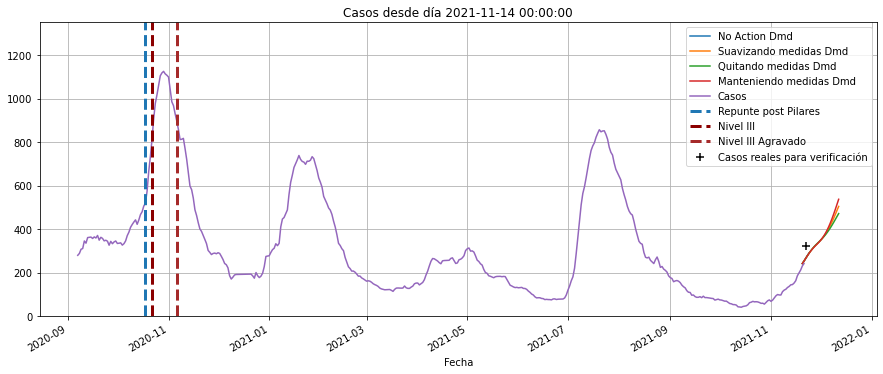

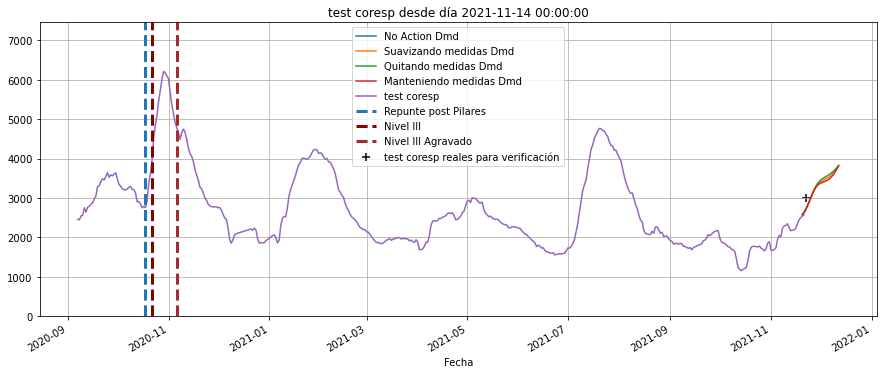

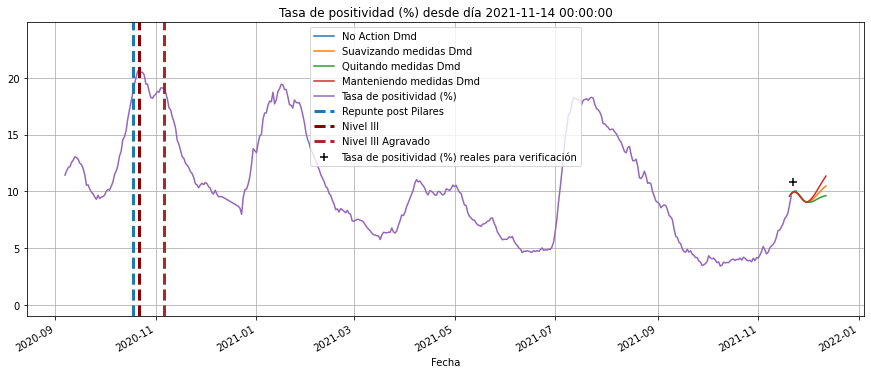

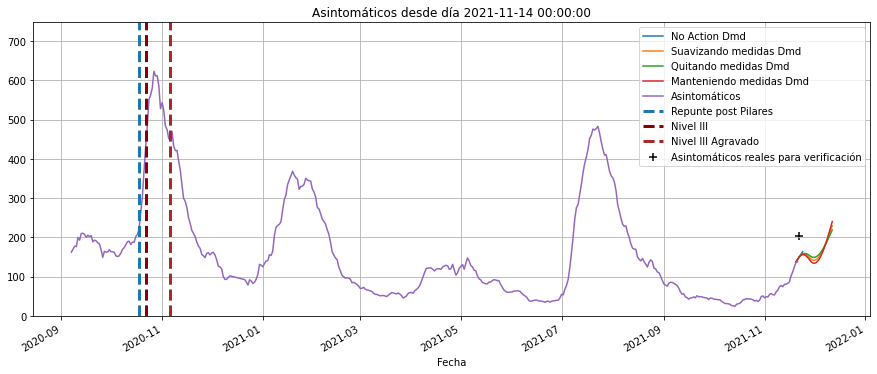

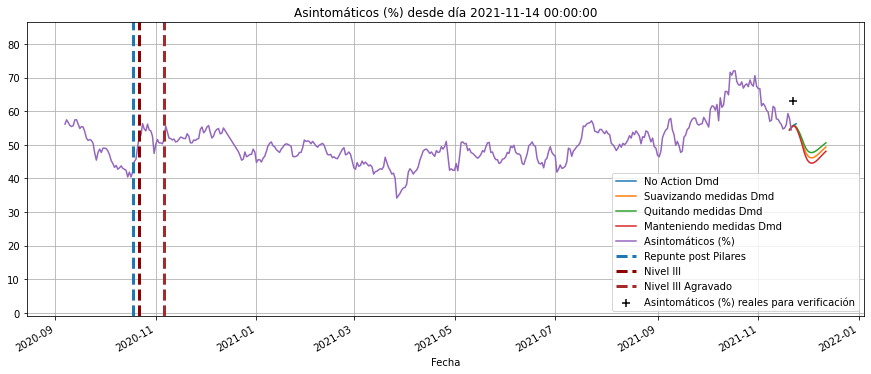

...

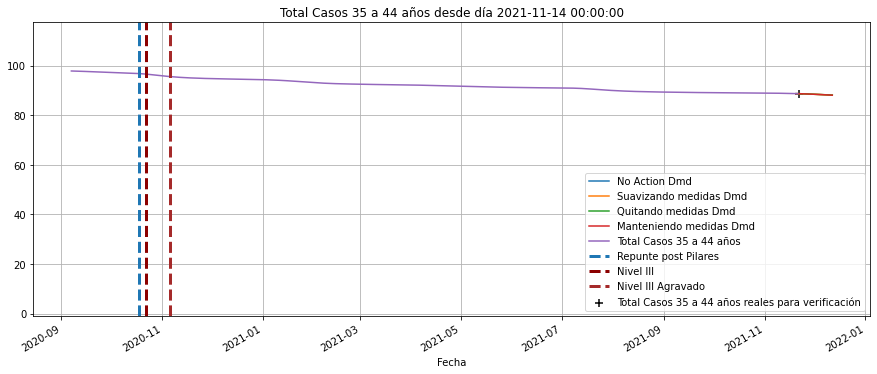

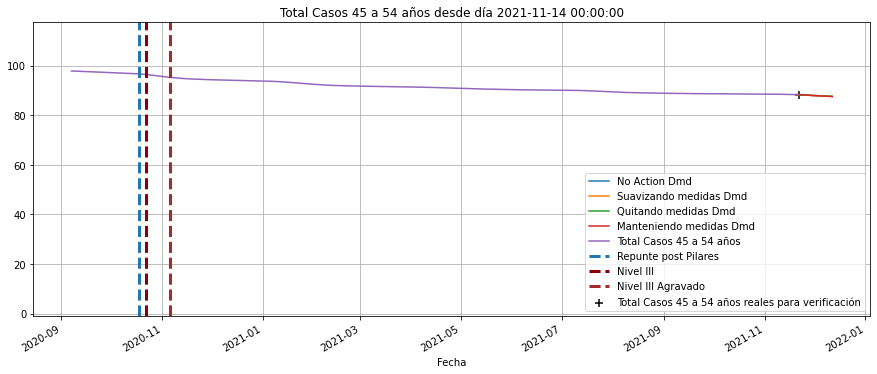

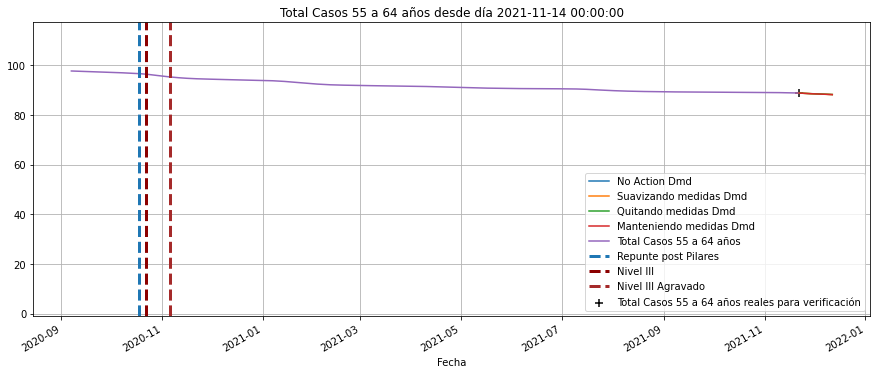

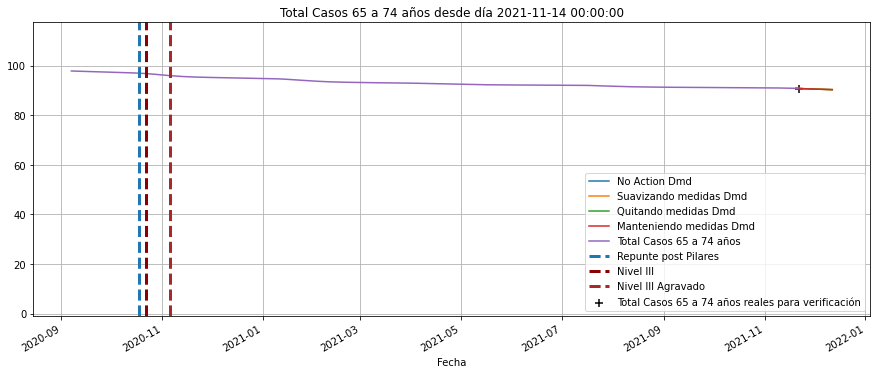

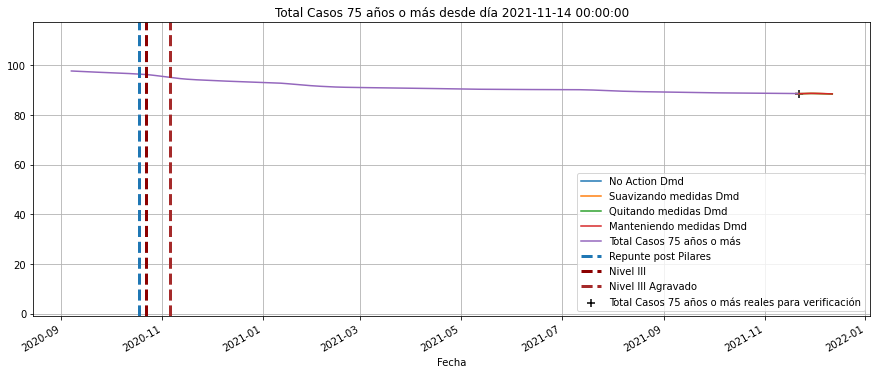

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

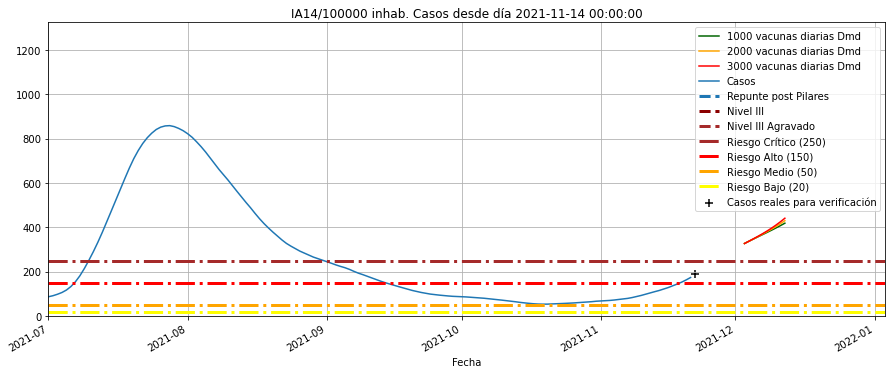

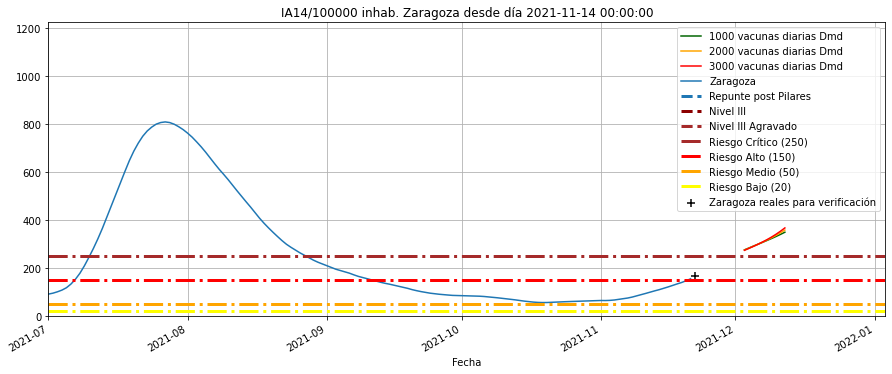

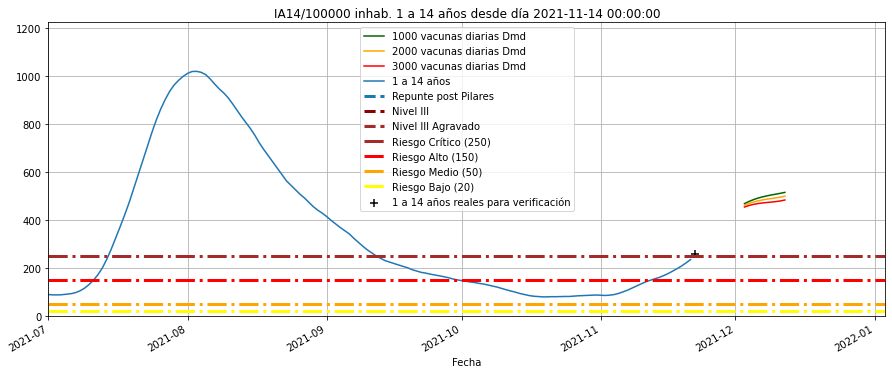

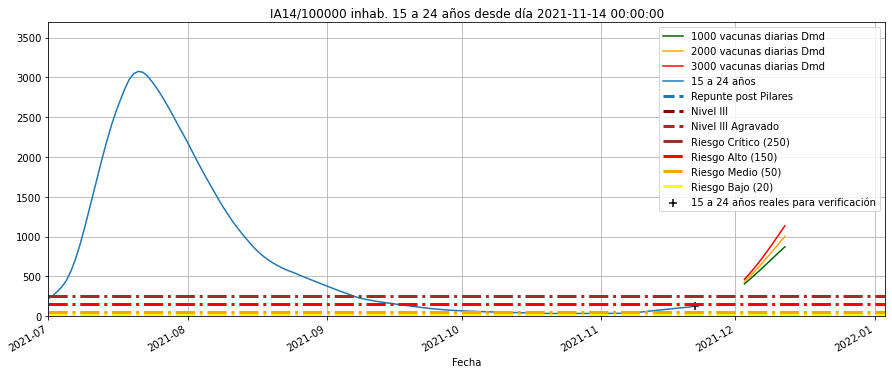

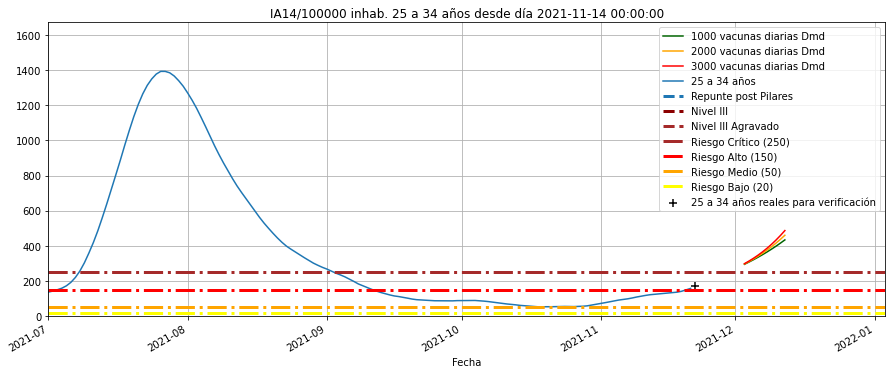

...

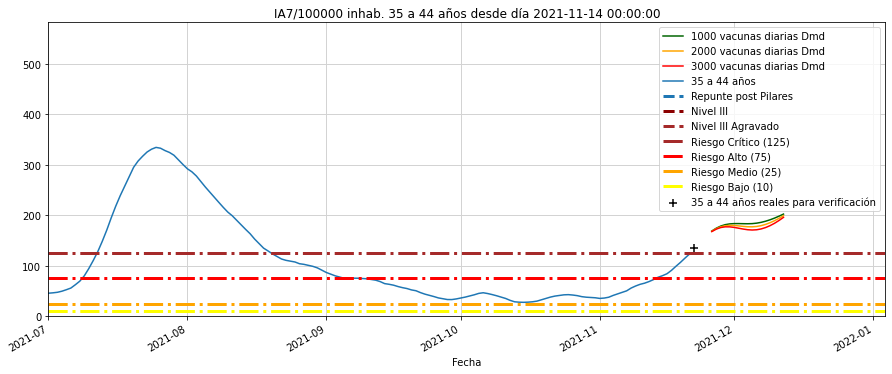

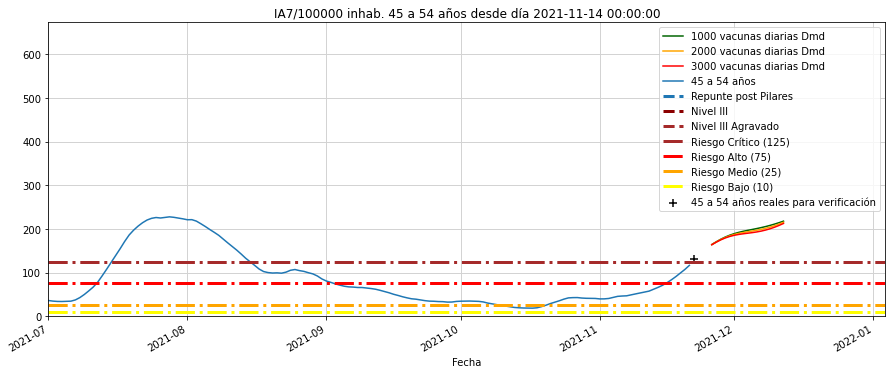

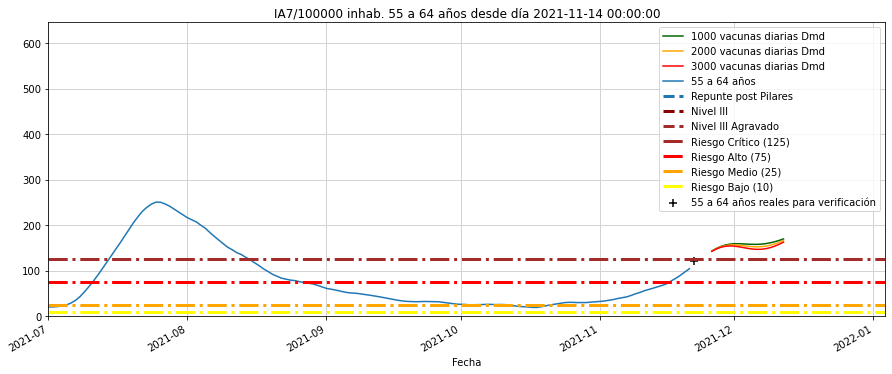

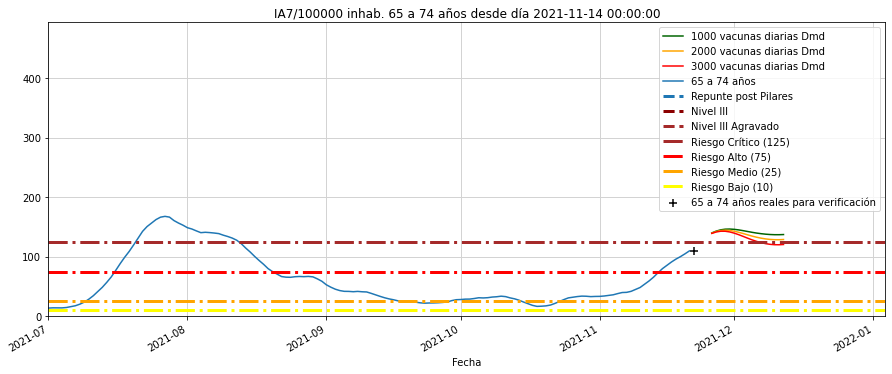

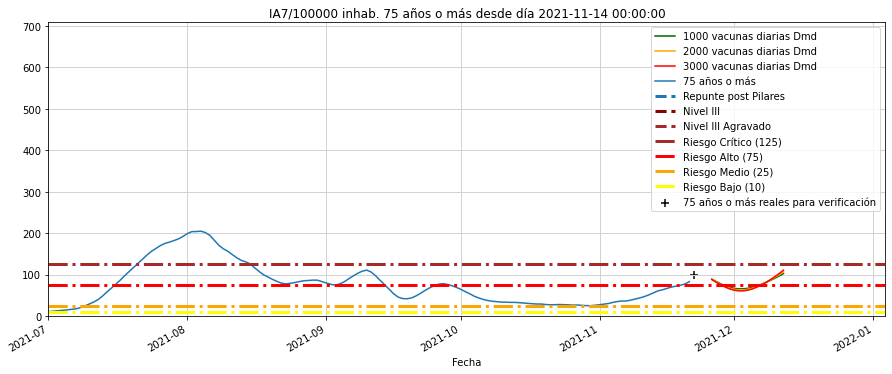

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-22,1,324.0,2998.0,0.0,10.81,204.12,190.0,60.0,18.0,30.0,...,NaN,87.327805,88.435579,80.989917,85.73358,88.580492,88.167585,88.813624,90.773739,88.562533
2021-11-23,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-24,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

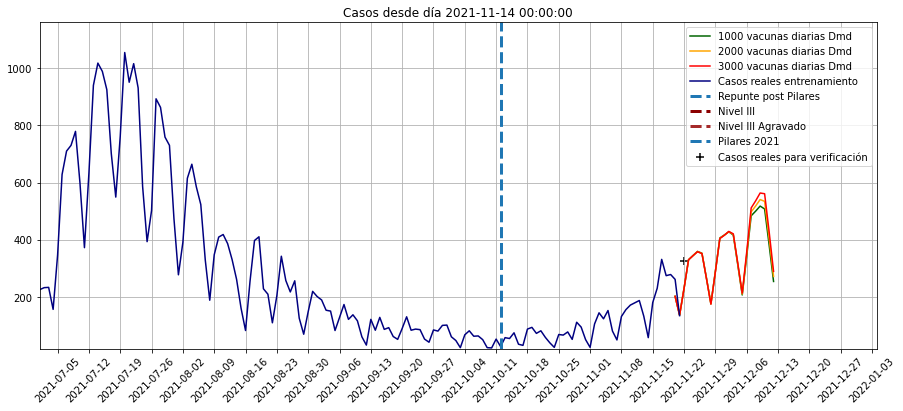

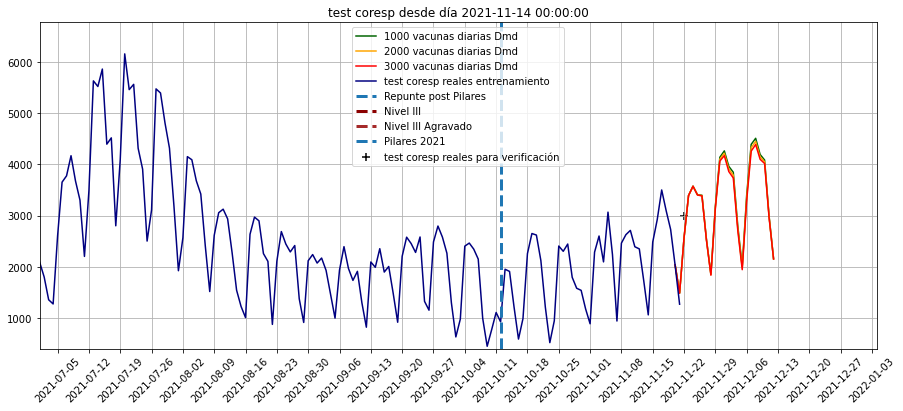

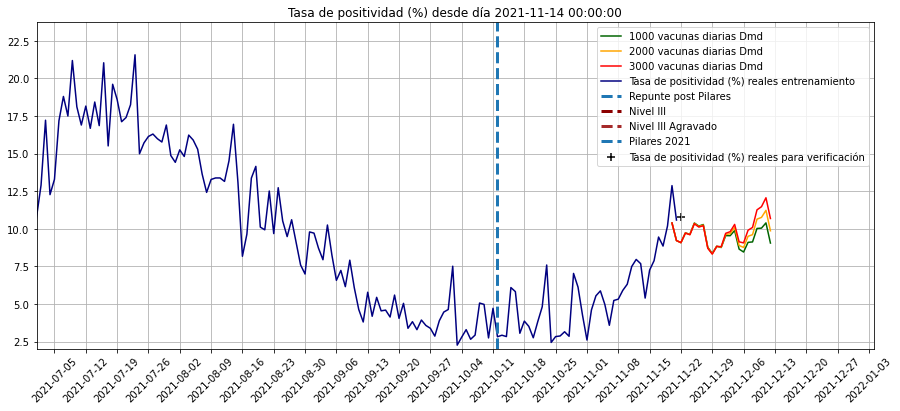

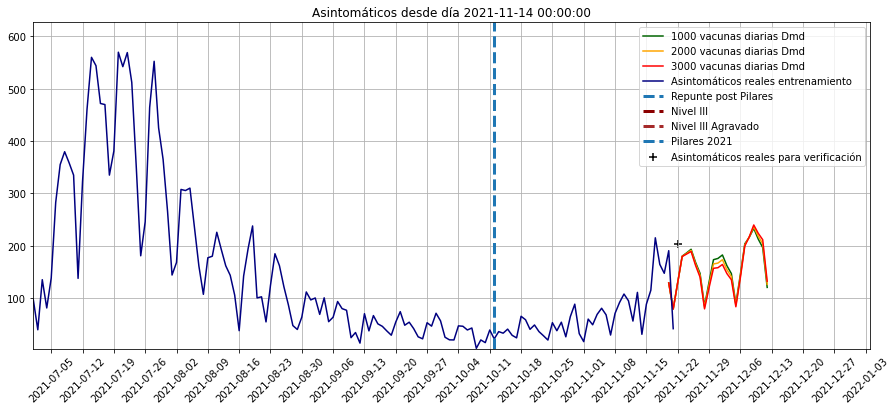

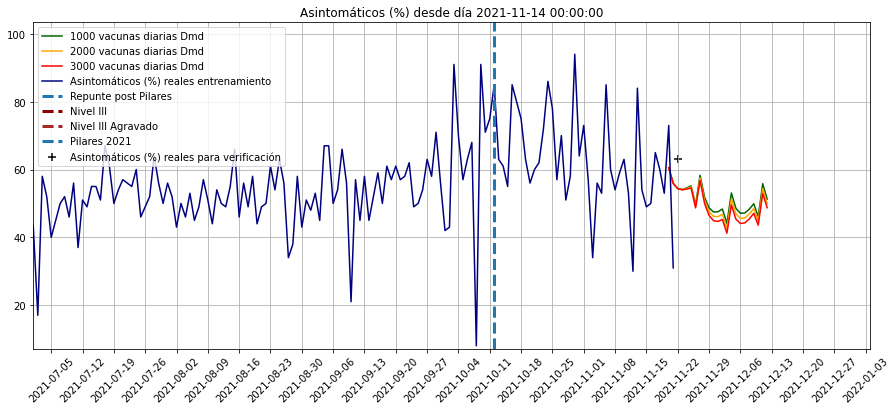

...

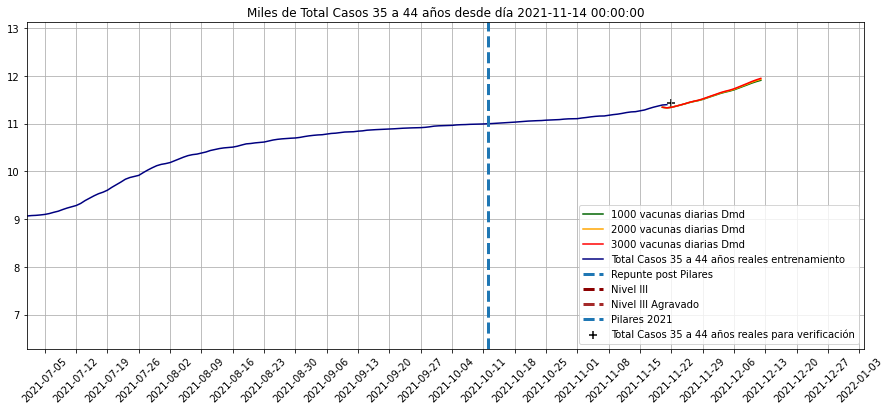

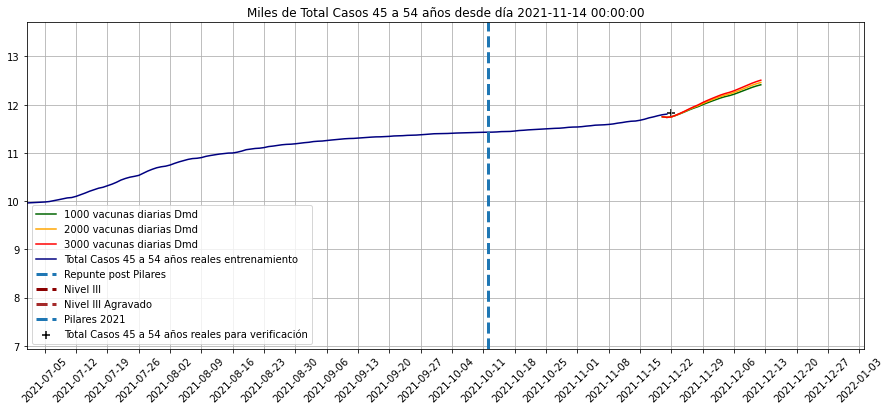

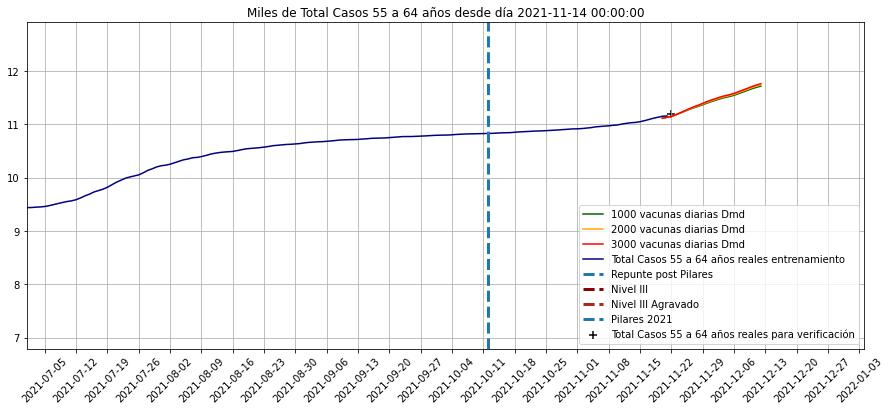

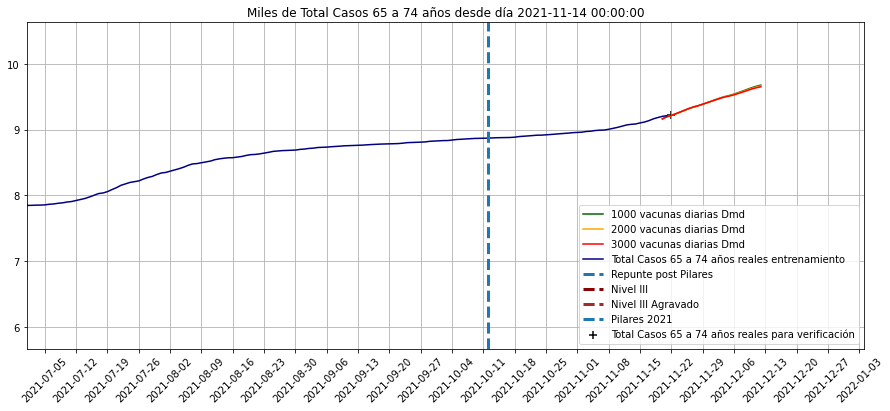

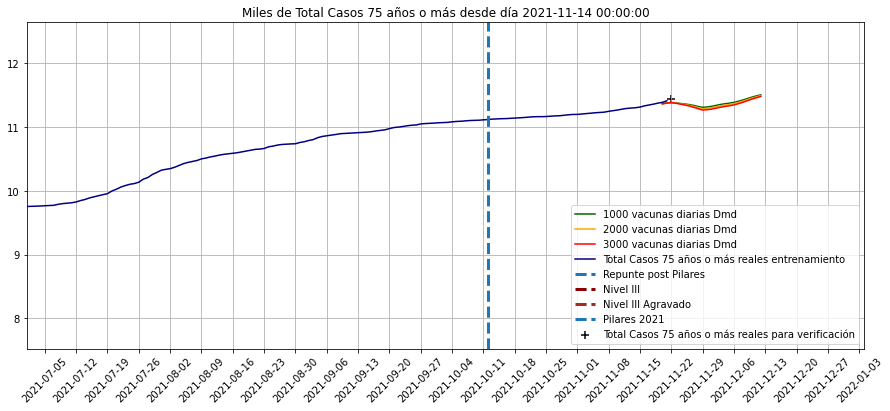

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index
kControl2.loc['Nº de pacientes a los que se ha realizado pruebas']=0

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-11-21':'2021-11-28'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas',
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-11-21':'2021-11-28'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-11-28,175,1843,0,9,51,105,38,76,213,1109,25,21,17,28,31,22,15,8
2021-11-27,265,2528,0,10,58,170,36,71,196,1134,50,30,25,43,46,33,24,13
2021-11-26,352,3391,0,10,49,217,34,72,183,1140,65,38,35,60,61,42,31,17
2021-11-25,358,3405,0,10,55,221,32,72,178,1061,65,35,34,60,61,48,35,19
2021-11-24,344,3574,0,10,54,215,31,76,168,1054,64,29,32,60,59,45,34,19
2021-11-23,330,3392,0,10,54,205,29,78,158,1069,62,23,30,62,59,46,31,22
2021-11-22,230,2569,0,9,54,131,27,82,149,1111,35,14,21,42,42,31,23,17
2021-11-21,136,1483,0,9,56,84,26,88,138,1247,20,7,12,24,25,18,14,14


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más,Nº de pacientes a los que se ha realizado pruebas
2021-11-20,201.634492,2037.976817,10.384971,128.900697,60.537837,133.493469,65.327451,38.027597,9.806993,18.088649,...,87.410349,88.528323,81.021534,85.794493,88.660124,88.250202,88.885087,90.837256,88.634762,0.0
2021-11-21,135.902674,1482.538881,9.216068,79.148898,55.906119,84.178975,61.026902,19.933172,7.062253,11.967263,...,87.395790,88.526437,81.031728,85.778213,88.672239,88.263180,88.867661,90.803988,88.623797,0.0
2021-11-22,229.608656,2569.169372,9.077746,129.441669,54.383863,130.836397,56.128620,35.391404,13.693405,20.864572,...,87.380755,88.510262,81.029313,85.771803,88.660736,88.252506,88.852166,90.784096,88.616391,0.0
2021-11-23,329.561673,3392.114372,9.719553,179.728335,54.063765,204.883441,60.267504,61.996222,22.762414,30.094708,...,87.363739,88.491342,81.008347,85.751011,88.638379,88.220155,88.820822,90.759135,88.623416,0.0
2021-11-24,344.146206,3574.221299,9.616845,185.244179,54.396455,214.960999,60.203280,64.387084,29.217567,31.981061,...,87.344674,88.472260,80.979514,85.730624,88.613640,88.181954,88.785654,90.732469,88.635180,0.0


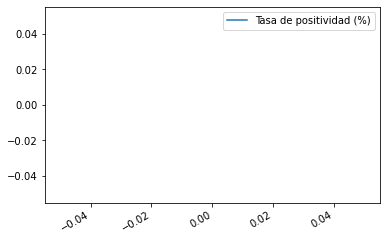

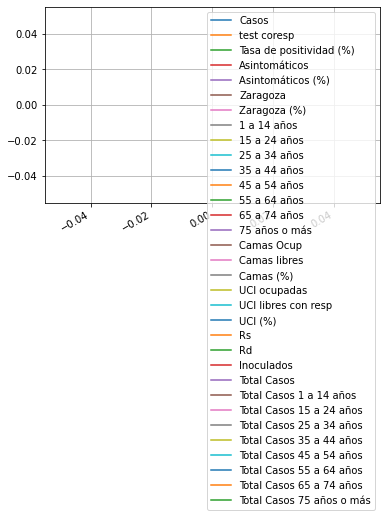

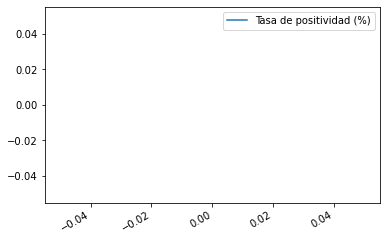

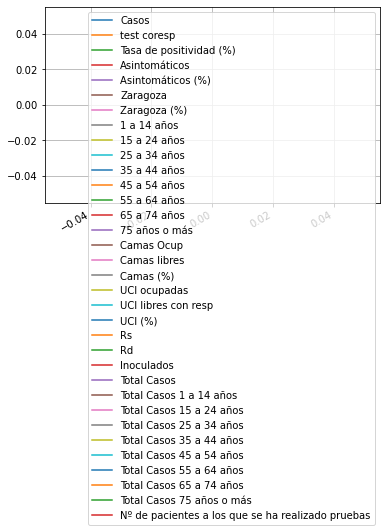

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-11-17     9.454442
2021-11-18     8.852989
2021-11-19    10.190616
2021-11-20    12.869822
2021-11-21    10.584518
Length: 417, dtype: float64

<AxesSubplot:xlabel='Fecha'>

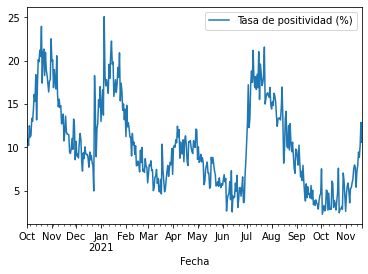

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,1.0,-41.014327,NaN,-41.014327,-41.014327,-41.014327,-41.014327,-41.014327
15 a 24 años,1.0,-23.925529,NaN,-23.925529,-23.925529,-23.925529,-23.925529,-23.925529
25 a 34 años,1.0,-30.451427,NaN,-30.451427,-30.451427,-30.451427,-30.451427,-30.451427
35 a 44 años,1.0,-16.896604,NaN,-16.896604,-16.896604,-16.896604,-16.896604,-16.896604
45 a 54 años,1.0,-25.929441,NaN,-25.929441,-25.929441,-25.929441,-25.929441,-25.929441
55 a 64 años,1.0,-37.273210,NaN,-37.273210,-37.273210,-37.273210,-37.273210,-37.273210
65 a 74 años,1.0,22.054937,NaN,22.054937,22.054937,22.054937,22.054937,22.054937
75 años o más,1.0,-55.270374,NaN,-55.270374,-55.270374,-55.270374,-55.270374,-55.270374
Asintomáticos,1.0,-36.585504,NaN,-36.585504,-36.585504,-36.585504,-36.585504,-36.585504
Asintomáticos (%),1.0,-13.676408,NaN,-13.676408,-13.676408,-13.676408,-13.676408,-13.676408


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-11-22    0.0
2021-11-23    NaN
2021-11-24    NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

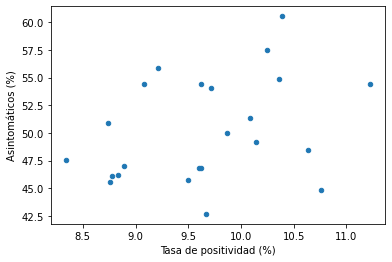

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

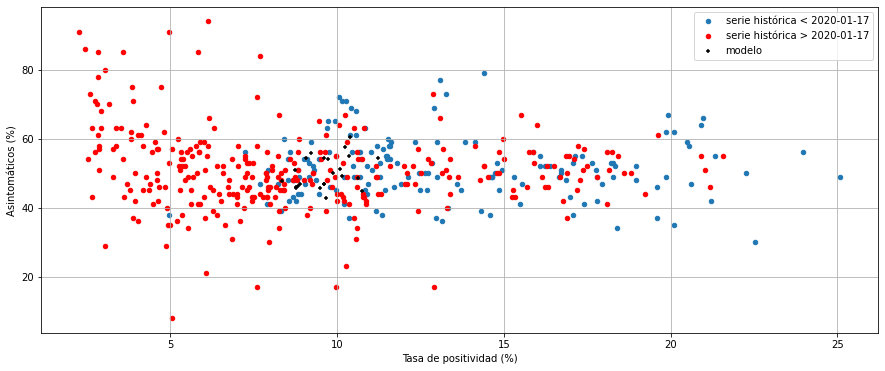

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más',
       'Nº de pacientes a los que se ha realizado pruebas'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-11-15,2021-11-16,2021-11-17,2021-11-18,2021-11-19,2021-11-20,2021-11-21,2021-11-22,2021-11-23,2021-11-24
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,180.000000,230.000000,331.000000,2.740000e+02,278.000000,261.000000,134.000000,324.000000,NaN,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,2482.000000,2919.000000,3501.000000,3.095000e+03,2728.000000,2028.000000,1266.000000,2998.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,NaN,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,7.250000,7.880000,9.450000,8.850000e+00,10.190000,12.870000,10.580000,10.810000,NaN,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,88.200000,115.000000,215.150000,1.644000e+02,147.340000,190.530000,41.540000,204.120000,NaN,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,92.000000,149.000000,209.000000,1.560000e+02,184.000000,194.000000,79.000000,190.000000,NaN,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,29.000000,33.000000,78.000000,3.900000e+01,48.000000,52.000000,18.000000,60.000000,NaN,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,7.000000,17.000000,13.000000,1.900000e+01,18.000000,9.000000,3.000000,18.000000,NaN,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,17.000000,20.000000,28.000000,2.000000e+01,33.000000,30.000000,6.000000,30.000000,NaN,NaN


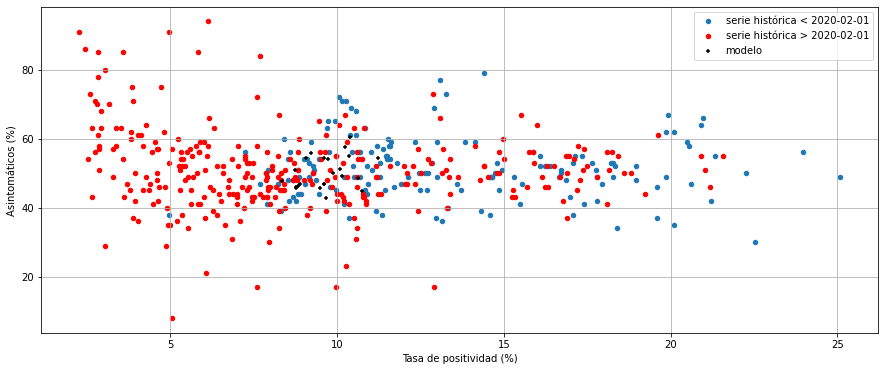

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.000000,-0.083537
Asintomáticos (%),-0.083537,1.000000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

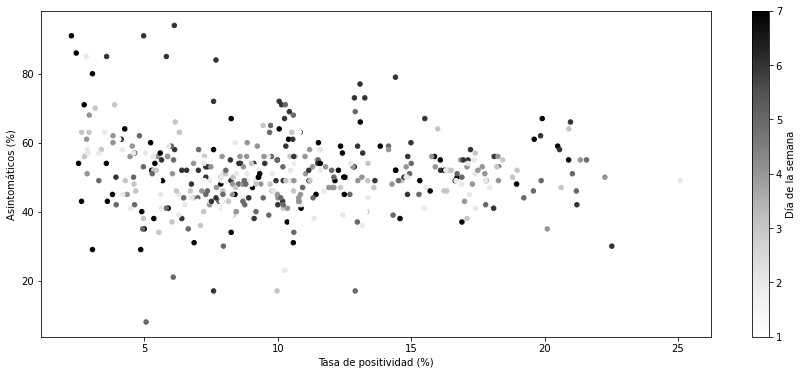

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-11-20,2021-11-21,2021-11-22,2021-11-23,2021-11-24,2021-11-25,2021-11-26,2021-11-27,2021-11-28,2021-11-29,...,2021-12-03,2021-12-04,2021-12-05,2021-12-06,2021-12-07,2021-12-08,2021-12-09,2021-12-10,2021-12-11,2021-12-12
Casos,201.634492,135.902674,229.608656,329.561673,344.146206,358.330770,351.829470,264.982828,174.913417,288.369435,...,418.310890,315.396237,209.568547,349.432937,497.359295,517.862944,540.416941,534.104296,406.217602,271.338167
test coresp,2037.976817,1482.538881,2569.169372,3392.114372,3574.221299,3405.155593,3390.758369,2528.067466,1842.737515,3168.156947,...,3791.625485,2757.286242,1973.404865,3354.721692,4326.394116,4450.801833,4147.470824,4052.351114,2976.078435,2152.741270
Tasa de positividad (%),10.384971,9.216068,9.077746,9.719553,9.616845,10.358705,10.146022,10.243153,8.734775,8.338490,...,9.671812,10.085814,8.888512,8.757260,9.499609,9.606933,10.639974,10.755242,11.225964,9.866231
Asintomáticos,128.900697,79.148898,129.441669,179.728335,185.244179,191.119211,165.211157,143.571003,82.180563,124.676835,...,154.282666,140.891841,86.193404,141.570700,201.557637,216.712475,236.391173,218.250377,204.067124,126.329520
Asintomáticos (%),60.537837,55.906119,54.383863,54.063765,54.396455,54.840189,49.140474,57.530836,50.936934,47.593902,...,42.679927,51.321582,46.978390,45.588244,45.724176,46.864866,48.488819,44.836931,54.383806,50.006725
Zaragoza,133.493469,84.178975,130.836397,204.883441,214.960999,221.156780,217.218709,169.696346,105.174228,159.592348,...,255.552003,200.531566,125.491703,193.265097,302.128841,318.178690,330.168819,328.477832,260.814696,164.574545
Zaragoza (%),65.327451,61.026902,56.128620,60.267504,60.203280,59.044967,58.504468,59.401459,55.018907,50.084427,...,53.231287,54.584263,51.173762,47.274213,51.304681,51.950138,51.743096,52.148147,53.932734,50.961233
1 a 14 años,38.027597,19.933172,35.391404,61.996222,64.387084,64.549852,64.548245,49.594288,24.678488,41.322371,...,64.407384,48.828687,24.285688,41.140568,69.536878,70.504174,69.805732,69.694591,54.001890,27.389675
15 a 24 años,9.806993,7.062253,13.693405,22.762414,29.217567,34.926197,37.903755,30.054463,21.114343,41.180802,...,87.327251,63.847402,41.465814,75.029581,113.082258,130.364536,139.670271,135.928216,96.769204,61.262512
25 a 34 años,18.088649,11.967263,20.864572,30.094708,31.981061,33.711287,34.611451,25.144687,16.506648,28.408755,...,46.366680,34.074380,22.771525,40.019621,58.134184,62.327928,66.432272,69.063623,50.800373,33.797422


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

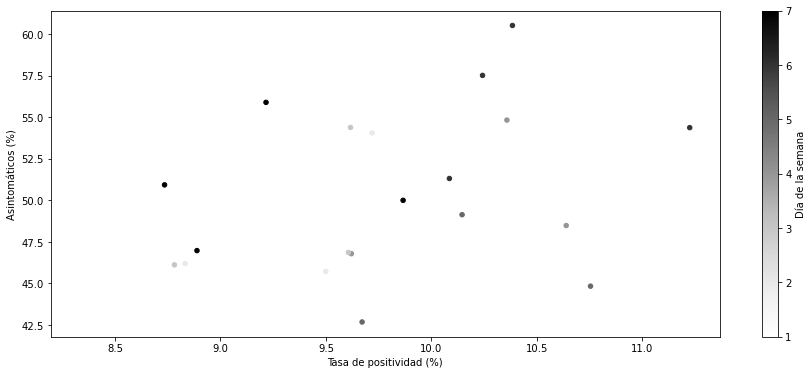

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

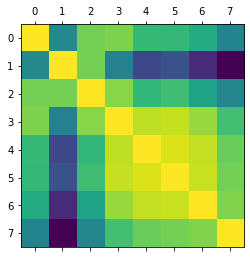

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

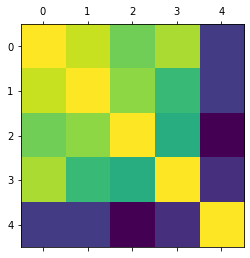

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

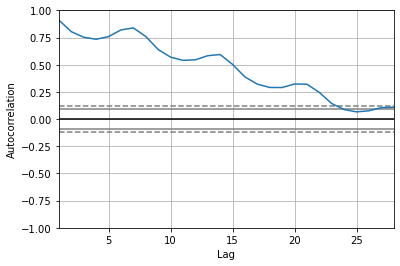

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

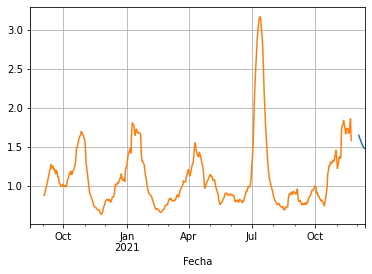

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

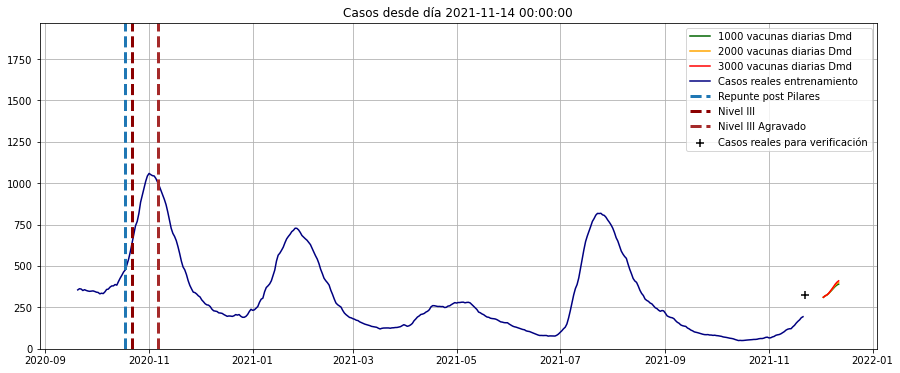

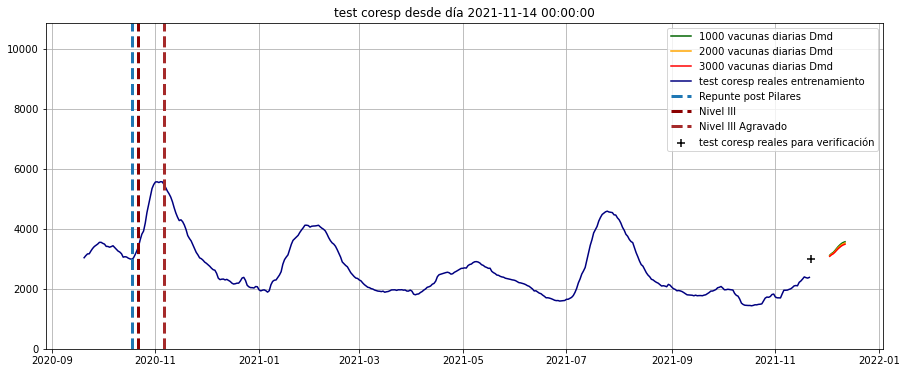

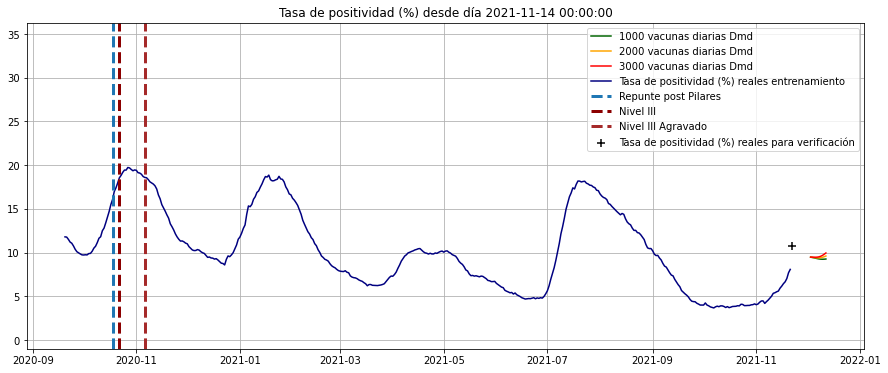

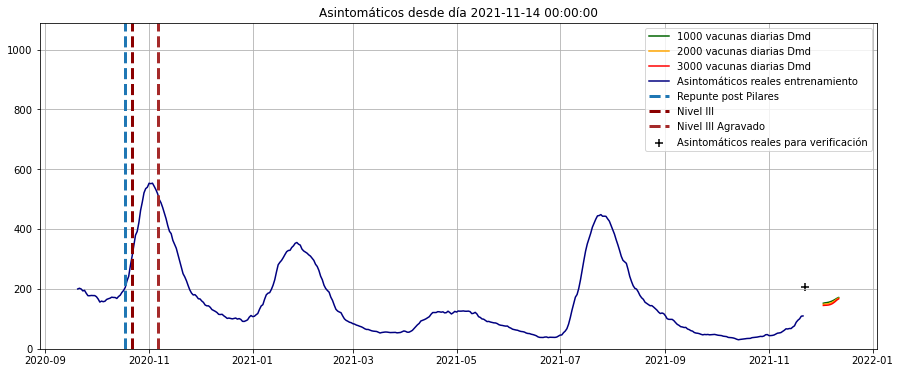

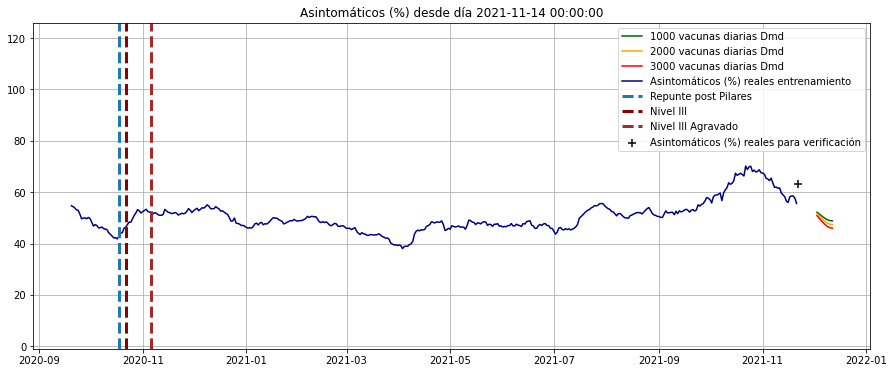

...

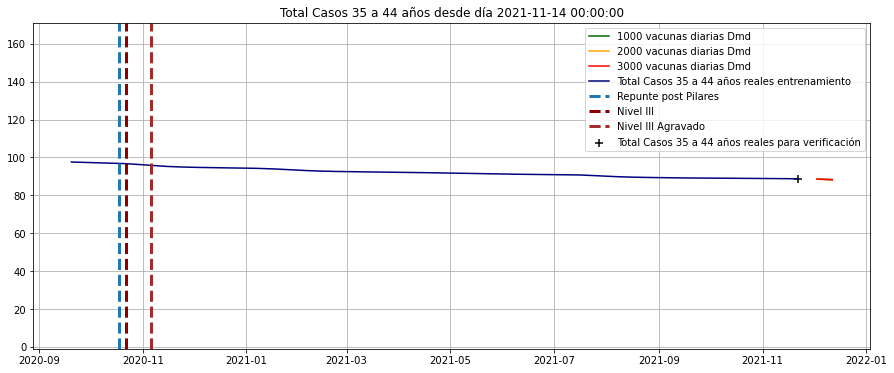

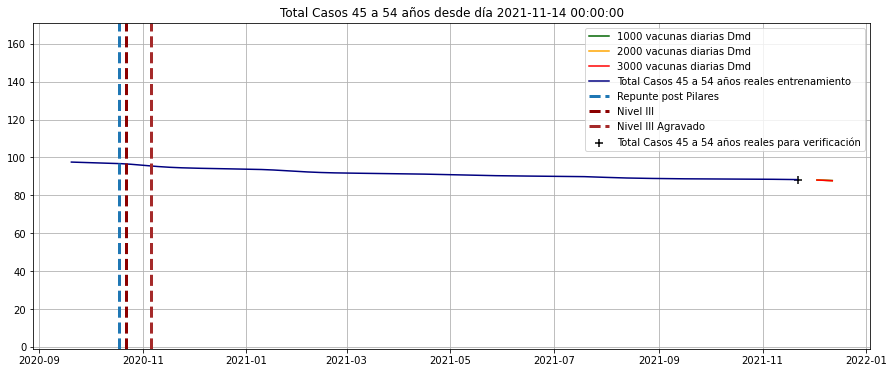

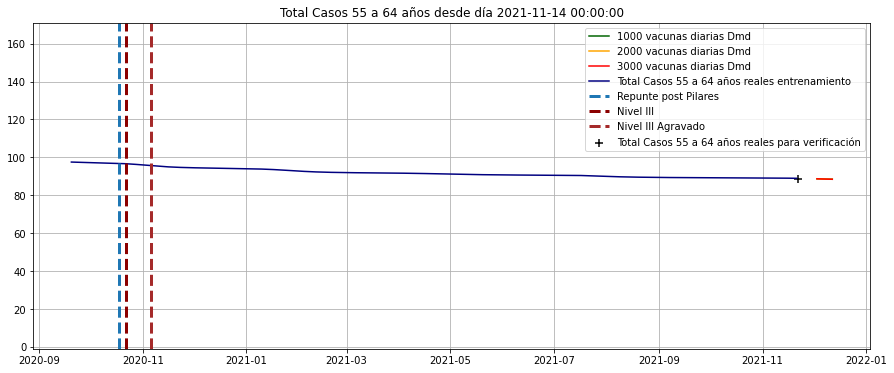

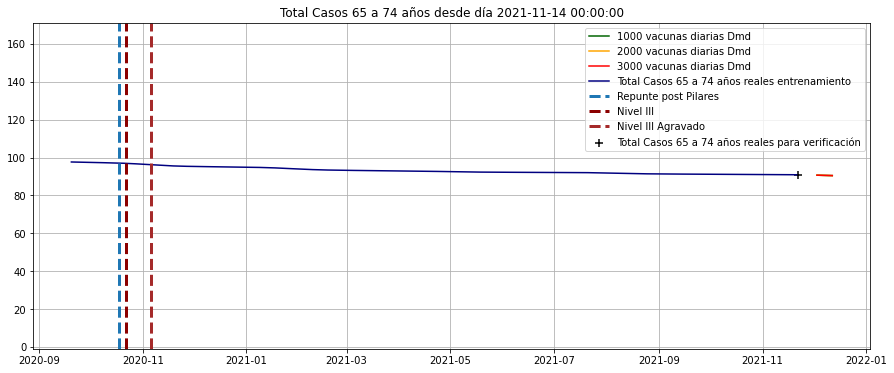

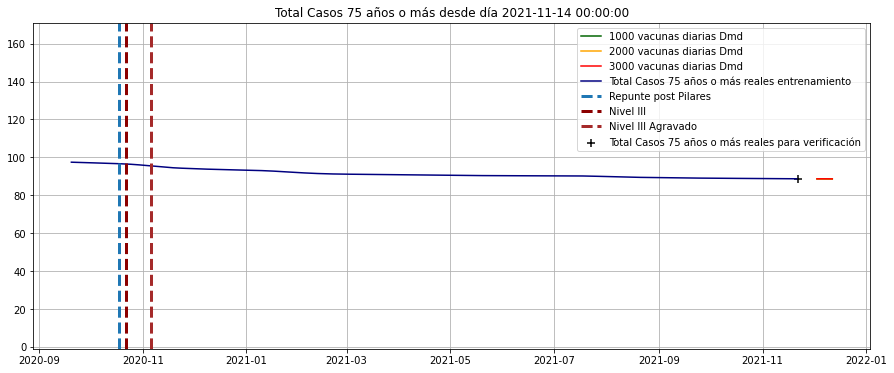

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

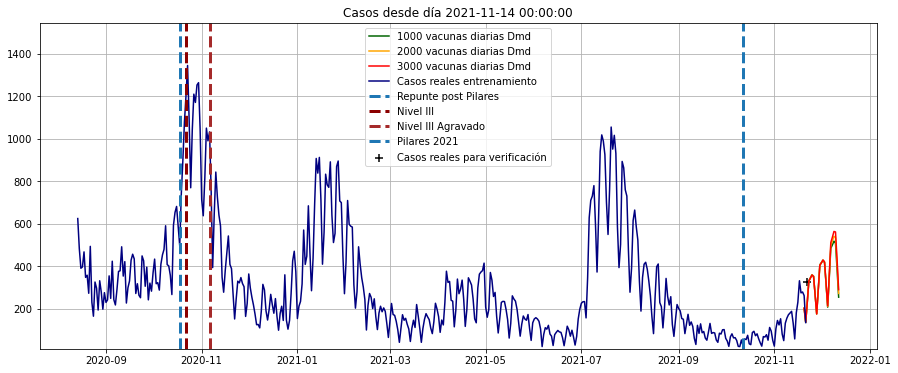

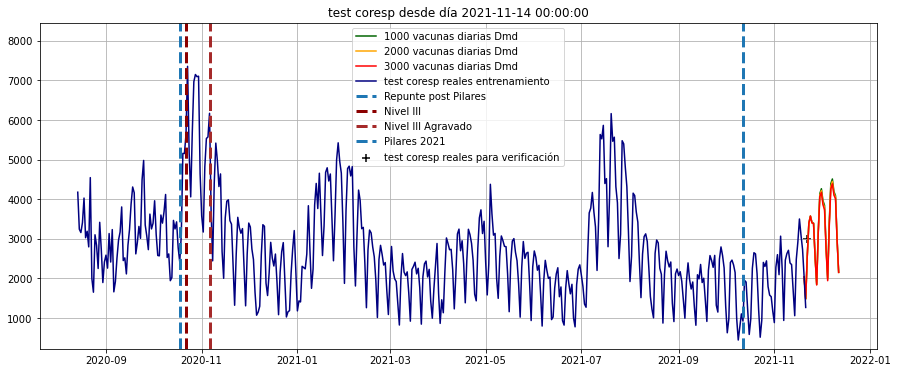

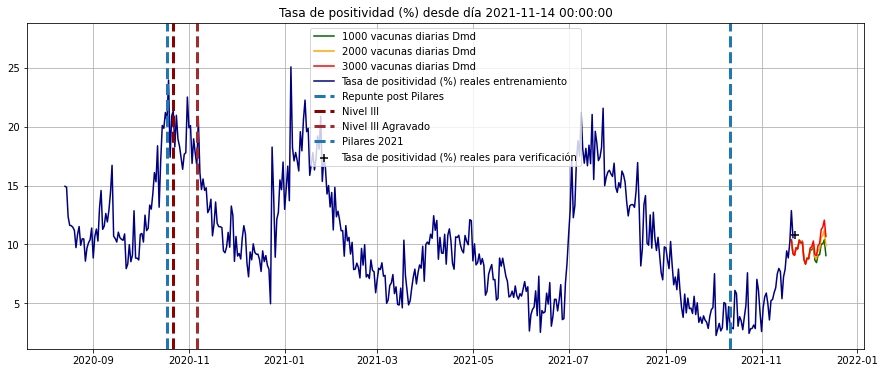

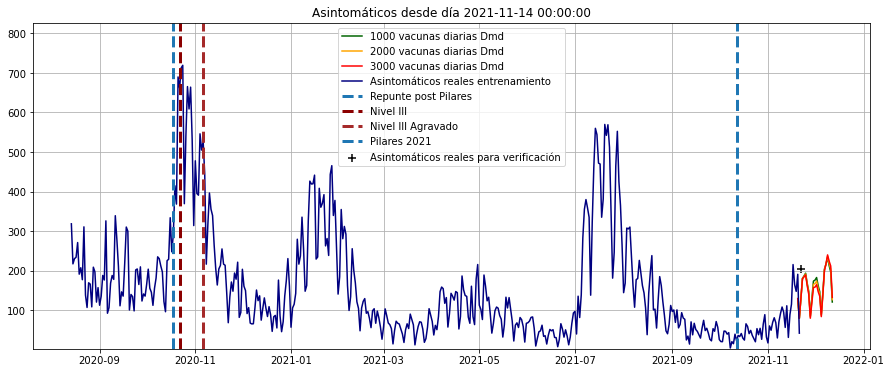

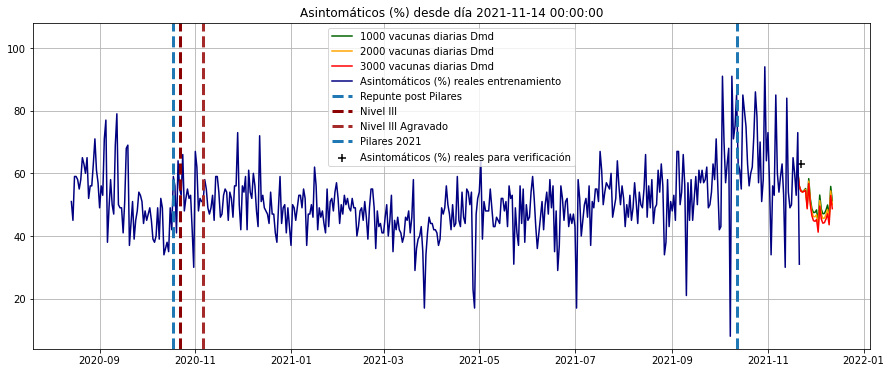

...

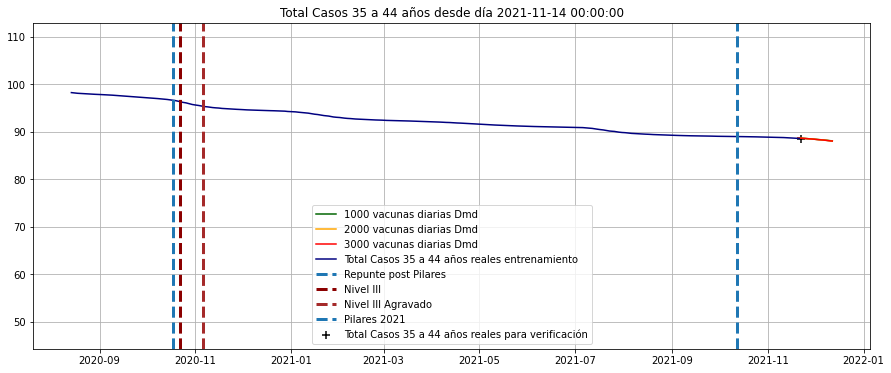

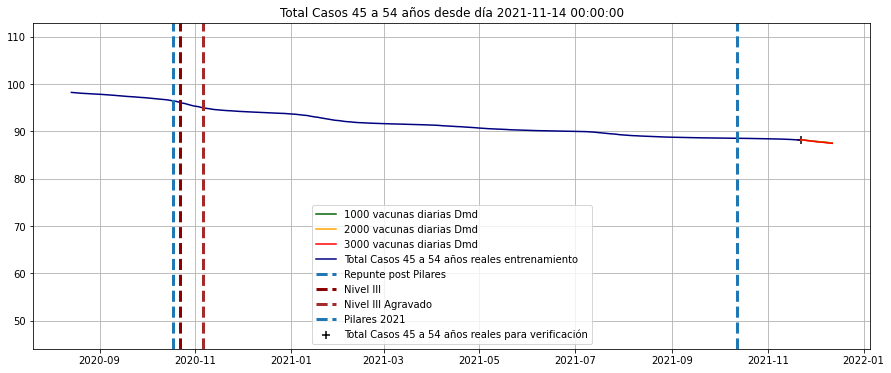

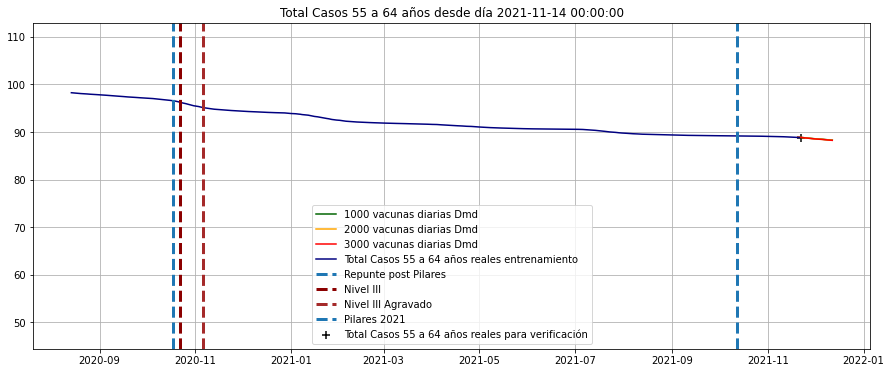

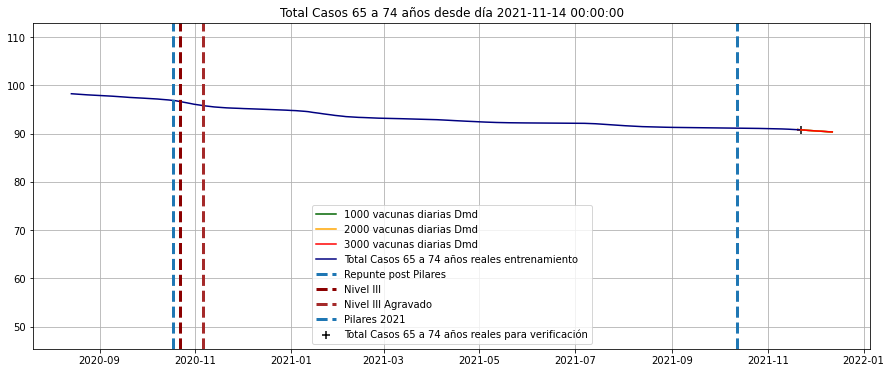

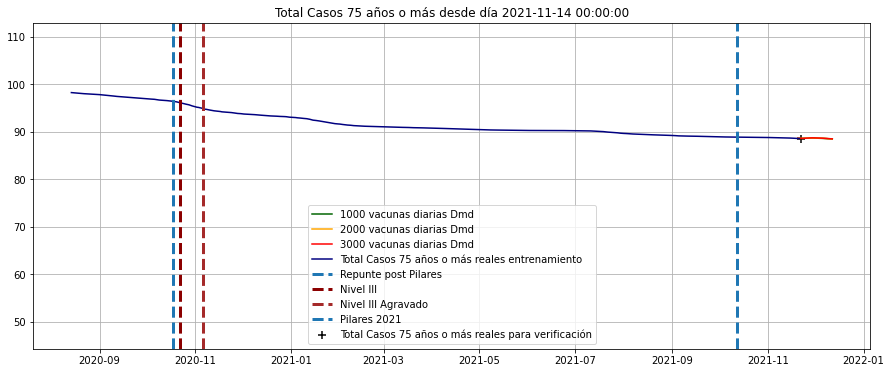

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Asintomáticos (%)
Fecha,,,
2021-03-19,-0.000683,0.000071,0.000280
2021-03-20,-0.000675,0.000036,0.002118
2021-03-21,-0.000464,0.000030,0.001050
2021-03-22,-0.001272,0.000142,-0.000588
2021-03-23,-0.001136,0.000133,-0.000754
2021-03-24,-0.000855,0.000104,-0.000624
2021-03-25,-0.000452,0.000044,0.000470
2021-03-26,-0.000974,0.000118,-0.000813
2021-03-27,-0.000471,0.000067,-0.000916


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Asintomáticos (%)
Casos,0.733844,0.014218,0.622168


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-11-22
Casos,324.0
test coresp,2998.0
Asintomáticos (%),63.0


Fecha,2021-11-23
Casos,319.586916


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,178.992452


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,314.421717
2021-04-18,249.433524
2021-04-19,132.786631
2021-04-20,204.066230


In [83]:
Casos = total.loc['2020-08-21':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-21,272.0,343.436961
2020-08-22,493.0,279.799368
2020-08-23,230.0,465.615668
2020-08-24,164.0,234.507086
2020-08-25,325.0,184.264866
...,...,...
2021-11-18,274.0,333.119692
2021-11-19,278.0,282.407327
2021-11-20,261.0,275.769612


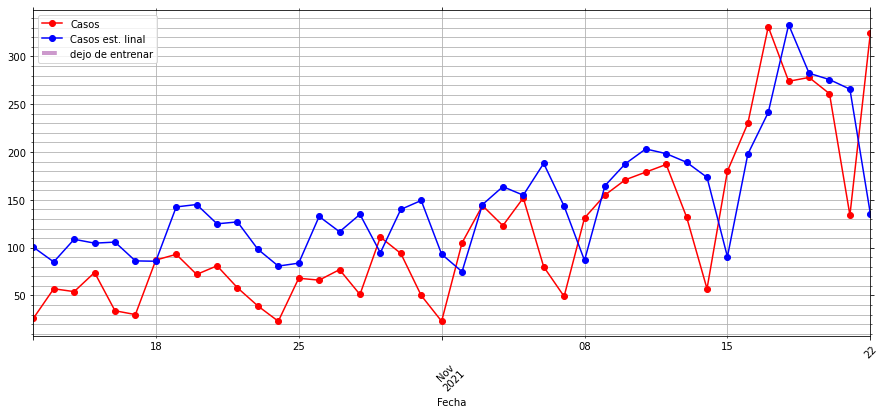

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

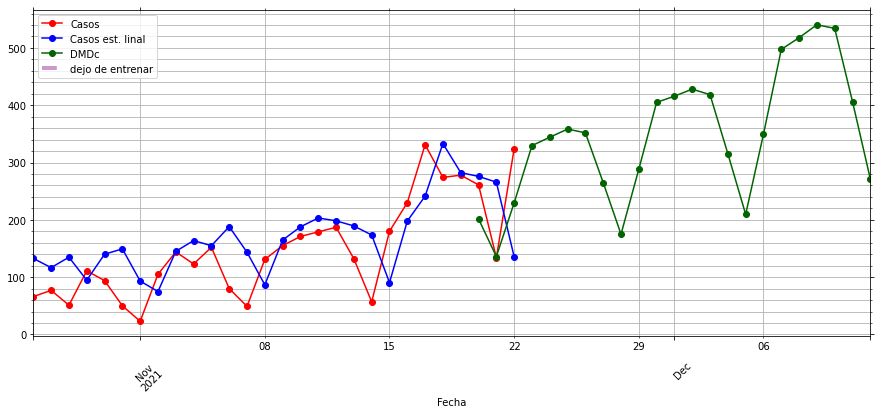

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(13.014103222616008, 114.96176721378056)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      #'Nº de pacientes a los que se ha realizado pruebas',
                      'Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

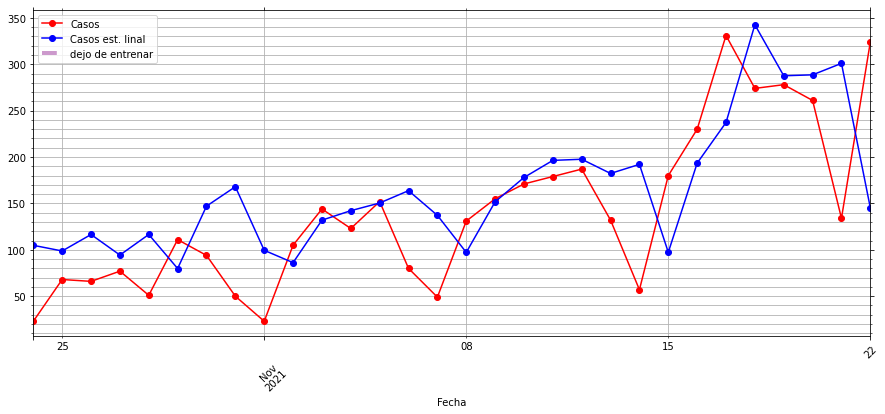

(-8.24396321000603, 109.07009105136513)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-05-09 00:00:00 312.35698924731184 261.85394528883774
2021-05-10 00:00:00 312.35698924731184 261.85394528883774
2021-05-11 00:00:00 312.35698924731184 261.85394528883774
2021-05-12 00:00:00 312.35698924731184 261.85394528883774
2021-05-13 00:00:00 312.35698924731184 261.85394528883774
2021-05-14 00:00:00 312.35698924731184 261.85394528883774
2021-05-15 00:00:00 312.35698924731184 261.85394528883774
2021-05-16 00:00:00 312.35698924731184 261.85394528883774
2021-05-17 00:00:00 312.35698924731184 261.85394528883774
2021-05-18 00:00:00 312.35698924731184 261.85394528883774
2021-05-19 00:00:00 312.35698924731184 261.85394528883774
2021-05-20 00:00:00 312.35698924731184 261.85394528883774
2021-05-21 00:00:00 312.35698924731184 261.85394528883774
2021-05-22 00:00:00 312.35698924731184 261.85394528883774
2021-05-23 00:00:00 312.35698924731184 261.85394528883774
2021-05-24 00:00:00 312.35698924731184 261.85394528883774
2021-05-25 00:00:00 312.35698924731184 261.85394528883774
2021-05-26 00:

2021-10-08 00:00:00 312.35698924731184 261.85394528883774
2021-10-09 00:00:00 312.35698924731184 261.85394528883774
2021-10-10 00:00:00 312.35698924731184 261.85394528883774
2021-10-11 00:00:00 312.35698924731184 261.85394528883774
2021-10-12 00:00:00 312.35698924731184 261.85394528883774
2021-10-13 00:00:00 312.35698924731184 261.85394528883774
2021-10-14 00:00:00 312.35698924731184 261.85394528883774
2021-10-15 00:00:00 312.35698924731184 261.85394528883774
2021-10-16 00:00:00 312.35698924731184 261.85394528883774
2021-10-17 00:00:00 312.35698924731184 261.85394528883774
2021-10-18 00:00:00 312.35698924731184 261.85394528883774
2021-10-19 00:00:00 312.35698924731184 261.85394528883774
2021-10-20 00:00:00 312.35698924731184 261.85394528883774
2021-10-21 00:00:00 312.35698924731184 261.85394528883774
2021-10-22 00:00:00 312.35698924731184 261.85394528883774
2021-10-23 00:00:00 312.35698924731184 261.85394528883774
2021-10-24 00:00:00 312.35698924731184 261.85394528883774
2021-10-25 00:

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-09-10 00:00:00 4.7822629688359575 108.42876773241473
2021-09-11 00:00:00 5.0938479370522 108.41258111380921
2021-09-12 00:00:00 4.755346462046324 108.4307065426908
2021-09-13 00:00:00 5.083916856622127 108.4131692174306
2021-09-14 00:00:00 4.887475842690634 108.42434043324441
2021-09-15 00:00:00 5.172160253750952 108.40923212517781
2021-09-16 00:00:00 5.2330902647400555 108.40596460273437
2021-09-17 00:00:00 5.449313494787963 108.39480013315105
2021-09-18 00:00:00 5.638855390353695 108.38541431276752
2021-09-19 00:00:00 5.559965692249244 108.38909452007252
2021-09-20 00:00:00 5.3863149848532546 108.3979733176698
2021-09-21 00:00:00 5.706763463137438 108.38269319071752
2021-09-22 00:00:00 5.7360033141189914 108.38129019641134
2021-09-23 00:00:00 5.825508514260261 108.37702959765262
2021-09-24 00:00:00 5.9976186938392955 108.3700663699178
2021-09-25 00:00:00 6.1199932716577035 108.36417880206922
2021-09-26 00:00:00 6.006981540334645 108.36995134666881
2021-09-27 00:00:00 6.093004565

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29,...,2021-11-11,2021-11-12,2021-11-13,2021-11-14,2021-11-15,2021-11-16,2021-11-17,2021-11-18,2021-11-19,2021-11-20
Casos,235.00,197.00,136.00,70.00,126.00,165.00,151.00,145.00,172.00,106.00,...,179.00,187.00,132.00,57.00,180.00,230.00,331.00,274.00,278.00,261.00
test coresp,2662.00,2448.00,1864.00,1021.00,2279.00,2931.00,2505.00,2636.00,2660.00,1879.00,...,2390.00,2348.00,1718.00,1057.00,2482.00,2919.00,3501.00,3095.00,2728.00,2028.00
Tasa de positividad (%),8.83,8.05,7.30,6.86,5.53,5.63,6.03,5.50,6.47,5.64,...,7.49,7.96,7.68,5.39,7.25,7.88,9.45,8.85,10.19,12.87
Asintomáticos (%),56.00,52.00,53.00,31.00,49.00,41.00,37.00,56.00,44.00,55.00,...,53.00,30.00,84.00,54.00,49.00,50.00,65.00,60.00,53.00,73.00
Casos$^{{-\Delta t}}$,245.00,235.00,197.00,136.00,70.00,126.00,165.00,151.00,145.00,172.00,...,171.00,179.00,187.00,132.00,57.00,180.00,230.00,331.00,274.00,278.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Asintomáticos (%)$^{-26\cdot \Delta t}$,54.00,50.00,54.00,23.00,17.00,47.00,52.00,54.00,64.00,39.00,...,85.00,80.00,75.00,63.00,56.00,60.00,62.00,72.00,86.00,78.00
Casos$^{-27\cdot \Delta t}$,245.00,152.00,133.00,297.00,362.00,372.00,379.00,414.00,208.00,159.00,...,74.00,34.00,30.00,87.00,93.00,72.00,81.00,58.00,39.00,23.00
test coresp$^{-27\cdot \Delta t}$,2456.00,1599.00,1433.00,2759.00,3529.00,3732.00,3133.00,3443.00,2420.00,1582.00,...,1215.00,584.00,984.00,2256.00,2649.00,2619.00,2119.00,1207.00,514.00,942.00
Tasa de positividad (%)$^{-27\cdot \Delta t}$,9.98,9.51,9.28,10.76,10.26,9.97,12.10,12.02,8.60,10.05,...,6.09,5.82,3.05,3.86,3.51,2.75,3.82,4.81,7.59,2.44


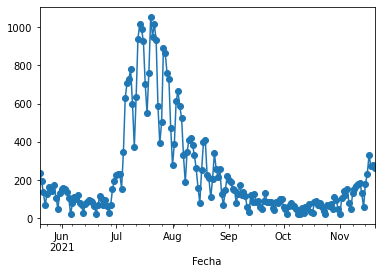

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', 'Tasa de positividad (%)',
                   #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 28
entrenoDesde = '2021-05-20'
entrenoHasta = '2021-11-20'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:
X_prima

Fecha,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29,...,2021-11-11,2021-11-12,2021-11-13,2021-11-14,2021-11-15,2021-11-16,2021-11-17,2021-11-18,2021-11-19,2021-11-20
Casos,197.0,136.0,70.0,126.0,165.0,151.0,145.0,172.0,106.0,50.0,...,187.0,132.0,57.0,180.0,230.0,331.0,274.0,278.0,261.0,134.0


In [94]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-20,0.000523,-0.000025,0.003227,0.000118,-0.000496,0.000042,0.003994,-0.000516,0.000467,-0.000017,...,-0.006951,0.000251,0.000002,-2.821487e-05,-0.013101,-0.000222,-0.000139,0.000003,-0.002262,0.000016
2021-05-21,0.000176,-0.000029,-0.011218,0.000583,0.000523,-0.000005,0.008487,-0.000237,-0.000591,0.000037,...,0.000854,-0.000248,0.000496,-4.270964e-05,-0.008180,0.000567,-0.000176,-0.000022,-0.011068,-0.000221
2021-05-22,0.000184,0.000023,-0.007312,-0.000483,-0.000110,-0.000030,-0.005308,0.000545,0.000848,-0.000028,...,0.018313,-0.001559,0.000419,1.436446e-05,-0.002996,-0.000305,0.000091,-0.000025,-0.007045,0.000764
2021-05-23,-0.000377,0.000009,0.007171,-0.000287,0.000268,0.000022,-0.006627,-0.000441,-0.000088,-0.000031,...,-0.018383,-0.002740,-0.000522,-2.505363e-05,0.017609,-0.001497,0.000390,0.000012,-0.005562,-0.000193
2021-05-24,-0.000532,0.000050,0.016945,-0.000802,-0.000109,-0.000017,-0.001846,0.000254,0.000172,0.000029,...,0.004631,0.001072,0.000543,-4.306796e-05,-0.019581,-0.003065,-0.000067,-0.000036,0.011230,-0.002175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-16,0.000099,0.000018,0.002223,-0.000203,-0.000068,-0.000028,-0.002679,0.000875,0.000046,-0.000010,...,-0.016365,0.001542,-0.000280,5.748577e-05,0.005045,0.000377,-0.000442,0.000046,-0.000733,0.000485
2021-11-17,-0.000017,0.000022,0.004003,0.000098,0.000087,0.000007,-0.000329,-0.000178,0.000019,-0.000026,...,0.012548,0.000515,0.000948,-8.949782e-05,-0.022121,0.001290,-0.000713,0.000091,0.010637,0.000119
2021-11-18,-0.000390,0.000034,0.006238,0.000759,0.000342,-0.000009,-0.002310,0.000307,-0.000168,0.000022,...,-0.001278,-0.000158,-0.000085,-2.293527e-05,0.007818,0.000332,0.000333,-0.000027,-0.006042,0.000955


In [95]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Casos,0.64121,0.009555,5.973735,-0.238649,-0.501835,-0.00638,0.033653,0.230036,0.573992,-0.00383,...,-2.200443,0.788215,0.159797,-0.005352,-0.98587,-0.255716,-0.425186,0.044348,10.76014,0.025056


In [96]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,8.31,48.0,334.0,3634.0,9.19,48.0,370.0,4377.0,...,9.27,50.0,235.0,2216.0,10.6,56.0,239.0,2734.0,8.74,49.0


,Casos est. lineal
Fecha,
2021-05-07,265.425058


In [97]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-05-25    165.0
2021-05-26    151.0
2021-05-27    145.0
2021-05-28    172.0
2021-05-29    106.0
              ...  
2021-11-18    274.0
2021-11-19    278.0
2021-11-20    261.0
2021-11-21    134.0
2021-11-22    324.0
Name: Casos, Length: 182, dtype: float64

In [98]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-05-25,214.215843
2021-05-26,183.015324
2021-05-27,157.831113
2021-05-28,171.660753
2021-05-29,108.459194
...,...
2021-11-18,299.476022
2021-11-19,287.085435
2021-11-20,304.730067


In [99]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-11-22'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-05-25,165.0,214.215843
2021-05-26,151.0,183.015324
2021-05-27,145.0,157.831113
2021-05-28,172.0,171.660753
2021-05-29,106.0,108.459194
...,...,...
2021-11-18,274.0,299.476022
2021-11-19,278.0,287.085435
2021-11-20,261.0,304.730067


In [100]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-05-25 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-11-20,261.0,304.730067,201.634492
2021-11-21,134.0,152.015483,135.902674
2021-11-22,324.0,344.429184,229.608656
2021-11-23,NaN,NaN,329.561673
2021-11-24,NaN,NaN,344.146206
2021-11-25,NaN,NaN,358.330770
2021-11-26,NaN,NaN,351.829470
2021-11-27,NaN,NaN,264.982828
2021-11-28,NaN,NaN,174.913417
2021-11-29,NaN,NaN,288.369435


(0.1761813018147121, 26.781799393143714)

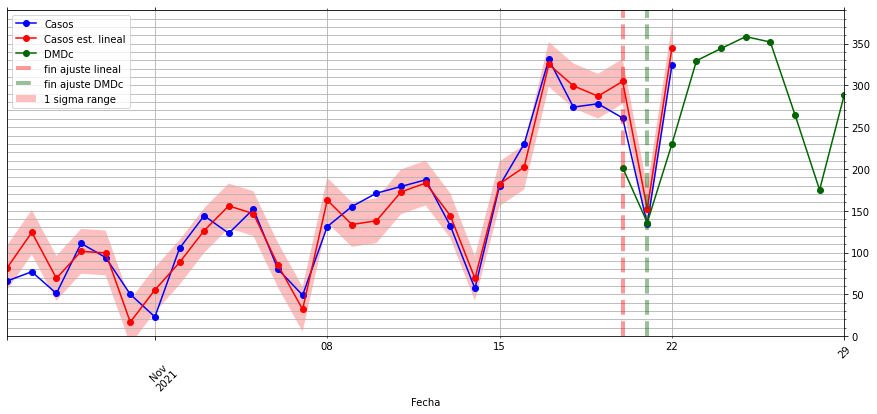

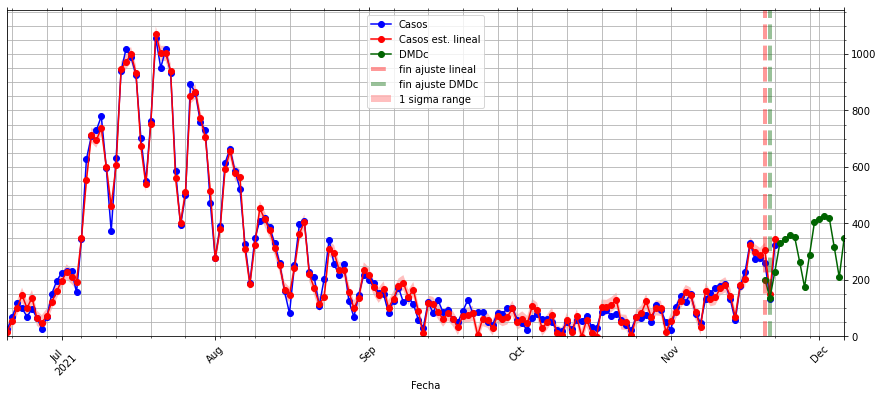

In [101]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

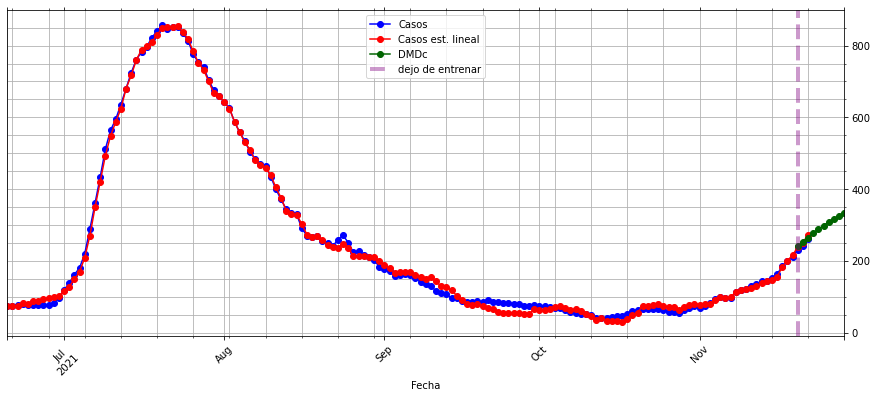

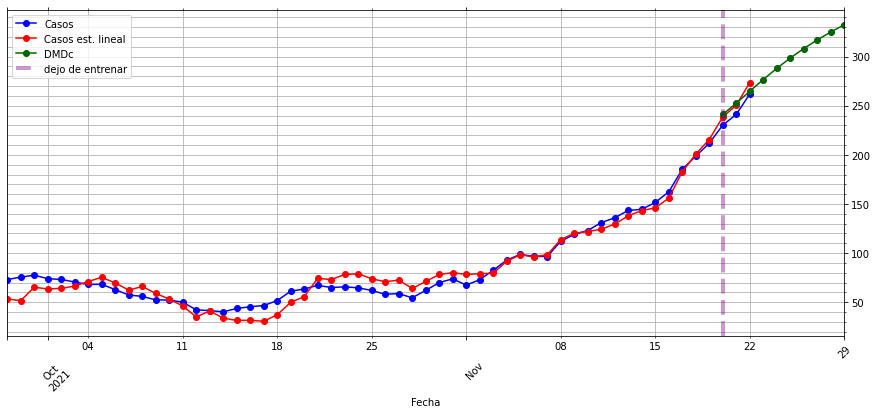

In [102]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [103]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(0.1761813018147121, 26.781799393143714)

In [104]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

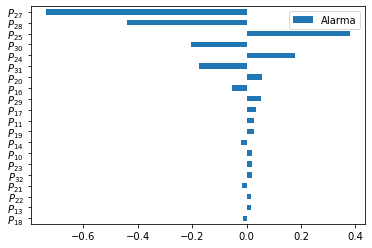

In [105]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

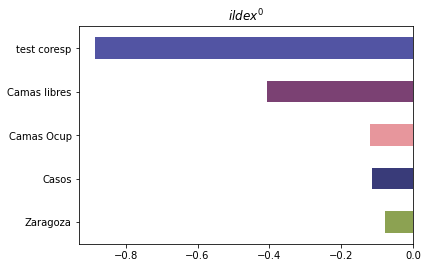

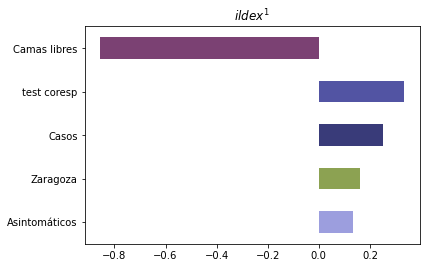

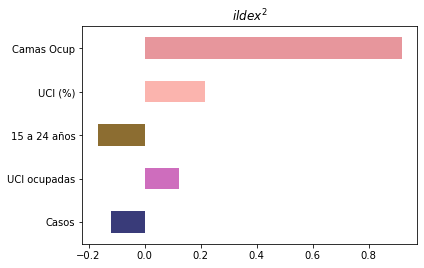

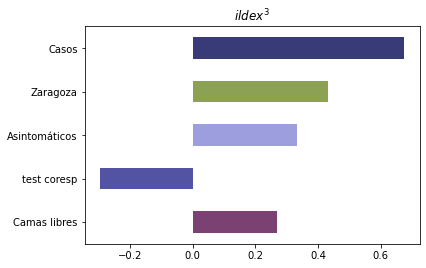

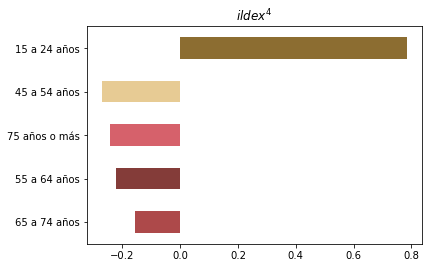

...

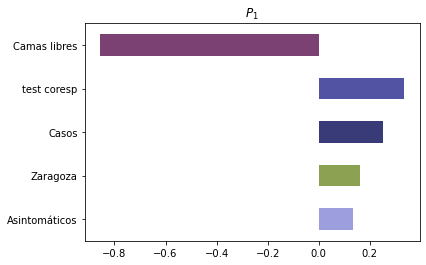

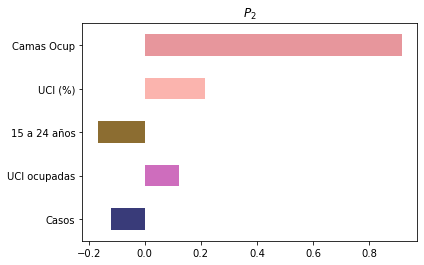

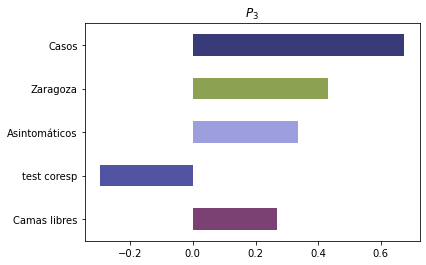

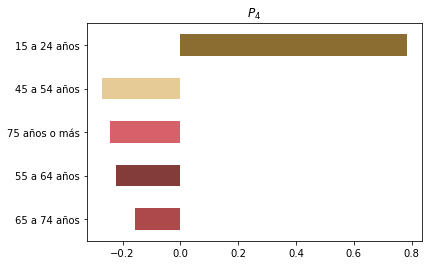

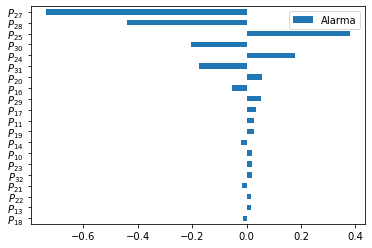

KeyError: 'Total Casos 65 a 74 años'

In [106]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes